# Train model

## Install Libraries



In [ ]:
pip install -U kaleido

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 16.0 MB/s eta 0:00:00


In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, TensorDataset, WeightedRandomSampler
from torch.utils.data import random_split
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR

import numpy as np
import pandas as pd
from scipy import signal
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from numpy.linalg import norm
from scipy.stats import kde

import sys
import os
import math
import time
import json
import pickle
import copy
import random
from copy import deepcopy
from tqdm.auto import tqdm
from datetime import datetime as dt

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import seaborn as sns
from IPython.display import display

## Colab setup & GPU usage



In [ ]:
print(torch.__version__)

if torch.cuda.is_available():
  device = torch.device("cuda")
else:
  device = torch.device("cpu")
device

1.13.1+cu116


device(type='cuda')

In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


## Utility functions



In [ ]:
# ECG dataset for training
def load_ecg_data(path="all_records_train.csv", np=True, drop_class=True, drop_patient=True):

  data = pd.read_csv(path, index_col=0).reset_index(drop=True)
  class_data = data['Class']
  patient_data = data['Patient']
  cols = set(data.columns)
  cols.remove('Class')
  cols.remove('Patient')
  if drop_class:
    data = data.drop('Class',axis=1)
  if drop_patient:
    data = data.drop('Patient',axis=1)
  # y = data.values.astype(float)
  y = data.loc[:, ~data.columns.isin(["Class", "Patient"])].values.astype(float)
  # y = data.loc[:, data.columns != 'Class' ].values.astype(float)
  f = signal.decimate(y, 3)
  data = pd.DataFrame(f)

  if np:
    return data.to_numpy()
  elif not drop_class and not drop_patient:
    data = pd.concat([data, class_data], axis=1)
    return pd.concat([data, patient_data], axis=1)
  elif not drop_class:
    return pd.concat([data, class_data], axis=1)
  elif not drop_patient:
    return pd.concat([data, patient_data], axis=1)
  else:
    return data


# Random vector generation
# Adapted from: https://github.com/vanderschaarlab/mlforhealthlabpub/blob/820ccf22d85bdce2e3f1211f84bf3b276016d9d6/alg/timegan/tgan.py#L167
def random_generator(batch_size, z_dim, T_mb, Max_Seq_Len, device='cuda'):

    Z_mb = list()

    for i in range(batch_size):

        Temp = np.zeros([Max_Seq_Len, z_dim])

        Temp_Z = np.random.uniform(0., 1, [T_mb[i], z_dim])

        Temp[:T_mb[i],:] = Temp_Z

        Z_mb.append(Temp_Z)

    return torch.from_numpy(np.array(Z_mb)).float().to(device)

## Encoder, Decoder, Supervisor, Generator, Discriminator



In [ ]:
# Initializations for parameters taken from: https://github.com/birdx0810/timegan-pytorch/blob/main/models/timegan.py

class Encoder(nn.Module):

    def __init__(self, nb_features, hidden_dim, output_dim, num_layers=3, rnn_type="gru", activation=True):

        super().__init__()

        self.activation = activation

        if rnn_type=="gru":
            self.rnn = nn.GRU(nb_features, hidden_dim, num_layers=num_layers, batch_first=True)

        elif rnn_type=="lstm":
            self.rnn = nn.LSTM(nb_features, hidden_dim, num_layers=num_layers, batch_first=True)

        self.fc = nn.Linear(hidden_dim, output_dim)

        self.sigmoid = nn.Sigmoid()

        self.nb_neurons_rnn = hidden_dim


        with torch.no_grad():
            for name, param in self.rnn.named_parameters():
                if 'weight_ih' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'weight_hh' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'bias_ih' in name:
                    param.data.fill_(1)
                elif 'bias_hh' in name:
                    param.data.fill_(0)
            for name, param in self.fc.named_parameters():
                if 'weight' in name:
                    torch.nn.init.xavier_uniform_(param)
                elif 'bias' in name:
                    param.data.fill_(0)

    def forward(self, data):

        output, hidden = self.rnn(data)

        if self.activation:
            return self.sigmoid(self.fc(output))

        return self.fc(output)


class Decoder(nn.Module):

    def __init__(self, nb_features, hidden_dim, output_dim, num_layers=3, rnn_type="gru", activation=True):

        super().__init__()

        self.activation = activation

        if rnn_type=="gru":
            self.rnn = nn.GRU(nb_features, hidden_dim, num_layers=num_layers, batch_first=True)

        elif rnn_type=="lstm":
            self.rnn = nn.LSTM(nb_features, hidden_dim, num_layers=num_layers, batch_first=True)

        self.fc = nn.Linear(hidden_dim, output_dim)

        self.sigmoid = nn.Sigmoid()

        self.output_dim = output_dim

        with torch.no_grad():
            for name, param in self.rnn.named_parameters():
                if 'weight_ih' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'weight_hh' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'bias_ih' in name:
                    param.data.fill_(1)
                elif 'bias_hh' in name:
                    param.data.fill_(0)
            for name, param in self.fc.named_parameters():
                if 'weight' in name:
                    torch.nn.init.xavier_uniform_(param)
                elif 'bias' in name:
                    param.data.fill_(0)

    def forward(self, data):

        output, hidden = self.rnn(data)

        if self.activation:
            return self.sigmoid(self.fc(output))

        return self.fc(output)


class EncoderDecoder(nn.Module):
    def __init__(self, features_per_timestep, nb_neurons_rnn, embedding_dim, nb_layers, rnn_type="gru", activation=True):

        super().__init__()

        self.encode = Encoder(features_per_timestep, nb_neurons_rnn, embedding_dim, nb_layers, rnn_type, activation)
        self.decode = Decoder(embedding_dim, nb_neurons_rnn, features_per_timestep, nb_layers, rnn_type, activation)

    def forward(self, data):

        h = self.encode(data)
        reconstructed_data = self.decode(h)

        return reconstructed_data


class Generator(nn.Module):

    def __init__(self, nb_features, hidden_dim, output_dim, num_layers=3, rnn_type="gru", activation=True):

        super().__init__()

        self.activation = activation

        if rnn_type=="gru":
            self.rnn = nn.GRU(nb_features, hidden_dim, num_layers=num_layers, batch_first=True)

        elif rnn_type=="lstm":
            self.rnn = nn.LSTM(nb_features, hidden_dim, num_layers=num_layers, batch_first=True)

        self.fc = nn.Linear(hidden_dim, output_dim)

        self.sigmoid = nn.Sigmoid()

        self.nb_features_output = output_dim

        with torch.no_grad():
            for name, param in self.rnn.named_parameters():
                if 'weight_ih' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'weight_hh' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'bias_ih' in name:
                    param.data.fill_(1)
                elif 'bias_hh' in name:
                    param.data.fill_(0)
            for name, param in self.fc.named_parameters():
                if 'weight' in name:
                    torch.nn.init.xavier_uniform_(param)
                elif 'bias' in name:
                    param.data.fill_(0)

    def forward(self, data):

        output, hidden = self.rnn(data)

        if self.activation:
            return self.sigmoid(self.fc(output))

        return self.fc(output)

# Supervisor
class Supervisor(nn.Module):

    def __init__(self, nb_features, hidden_dim, output_dim, num_layers=2, rnn_type="gru", activation=True):

        super().__init__()

        self.activation = activation

        if rnn_type=="gru":
            self.rnn = nn.GRU(nb_features, hidden_dim, num_layers=num_layers, batch_first=True)

        elif rnn_type=="lstm":
            self.rnn = nn.LSTM(nb_features, hidden_dim, num_layers=num_layers, batch_first=True)

        self.fc = nn.Linear(hidden_dim, output_dim)

        self.sigmoid = nn.Sigmoid()

        self.nb_neurons_rnn = hidden_dim

        with torch.no_grad():
            for name, param in self.rnn.named_parameters():
                if 'weight_ih' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'weight_hh' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'bias_ih' in name:
                    param.data.fill_(1)
                elif 'bias_hh' in name:
                    param.data.fill_(0)
            for name, param in self.fc.named_parameters():
                if 'weight' in name:
                    torch.nn.init.xavier_uniform_(param)
                elif 'bias' in name:
                    param.data.fill_(0)


    def forward(self, data):

        output, hidden = self.rnn(data)

        if self.activation:
            return self.sigmoid(self.fc(output))

        return self.fc(output)


class Discriminator(nn.Module):

    def __init__(self, nb_features, hidden_dim, num_layers=3, rnn_type="gru", activation=True):

        super().__init__()

        self.activation = activation

        if rnn_type=="gru":
            self.rnn = nn.GRU(nb_features, hidden_dim, num_layers=num_layers, batch_first=True, bidirectional=False)

        elif rnn_type=="lstm":
            self.rnn = nn.LSTM(nb_features, hidden_dim, num_layers=num_layers, batch_first=True, bidirectional=False)

        self.fc = nn.Linear(hidden_dim, 1)

        self.sigmoid = nn.Sigmoid()

        with torch.no_grad():
            for name, param in self.rnn.named_parameters():
                if 'weight_ih' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'weight_hh' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'bias_ih' in name:
                    param.data.fill_(1)
                elif 'bias_hh' in name:
                    param.data.fill_(0)
            for name, param in self.fc.named_parameters():
                if 'weight' in name:
                    torch.nn.init.xavier_uniform_(param)
                elif 'bias' in name:
                    param.data.fill_(0)

    def forward(self, data):

        output, hidden = self.rnn(data)

        if self.activation:
            return torch.mean(self.sigmoid(self.fc(output)), dim=1)

        return torch.mean(self.fc(output), dim=1)

## Dataset



In [ ]:
# nb_samples=76065, nb_features=1
class ECGDataset(Dataset):
    def __init__(self, file_loc="/content/drive/MyDrive/Colab Notebooks/all_records_train.csv"):
        data = load_ecg_data(file_loc)
        data = np.expand_dims(data, axis=(2))

        max_sequence_length = data.shape[1]
        sequence_lengths_list = [max_sequence_length]*len(data)

        self.data = torch.from_numpy(np.array(data)).float().to(device)
        self.sequence_lengths_list = sequence_lengths_list
        self.features_per_timestep = data.shape[2]
        self.max_sequence_length = max_sequence_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):

        return self.data[idx], self.sequence_lengths_list[idx]


In [ ]:
# Steps used to create train and test files from "all_records.csv" file

# file_loc= "/content/drive/MyDrive/Colab Notebooks/all_records.csv"
# data = pd.read_csv(file_loc, index_col=0)
# # Patients 201 and 202 are the same person
# data.loc[data['Patient']==202, 'Patient']=201
# data.reset_index(inplace=True, drop=True)
# # shuffle the data and split into train and validation sets
# X_train, X_test, _, _ = train_test_split(data, pd.Series([1]*len(data)), test_size=0.2, shuffle=True, random_state=2, stratify=data['Class'])
# # save to files
# X_train.to_csv('all_records_train.csv')
# X_test.to_csv('all_records_test.csv')
# # Check same proportions in each dataset
# X_train['Class'].value_counts(normalize=True).to_frame()
# X_test['Class'].value_counts(normalize=True).to_frame()

## Create dataset & Set network parameters

In [ ]:
training_data = ECGDataset()

current_date_and_time = dt.now().strftime("%Y_%m_%d-%H_%M_%S")
saved_model_directory = f"timegan_ECG_{current_date_and_time}"
os.mkdir(saved_model_directory)
os.mkdir(saved_model_directory + "/plots")

In [ ]:
# Create Newtork Parameters
parameters = dict()

# hidden dimention in rnns
# parameters['nb_neurons_rnn'] = max(20, training_data.features_per_timestep * 4)
parameters['nb_neurons_rnn'] = 20
# For stacked rnns
parameters['nb_layers'] = 3
# nb of iterations for training
parameters['nb_iterations'] = 25000
# nb of iterations for pretraining
parameters['nb_iterations_pretraining'] = 10000
# nb of examples per batch
parameters['batch_size'] = 128
# type of rnn cell to use
parameters['rnn_type'] = 'gru'   # options: 'gru' or 'lstm'
# nb of features per time step in random data fed to generator
parameters['z_dim'] = training_data.features_per_timestep
# learning rate
parameters['lr'] = 0.001
# whether to use sigmoid activation for outputs of encoder, decoder, generator, supervisor
parameters['activation'] = True

parameters

{'nb_neurons_rnn': 20,
 'nb_layers': 3,
 'nb_iterations': 25000,
 'nb_iterations_pretraining': 10000,
 'batch_size': 128,
 'rnn_type': 'gru',
 'z_dim': 1,
 'lr': 0.001,
 'activation': True}

## Create  network



In [ ]:
# Set network parameters
features_per_timestep = training_data.features_per_timestep
max_sequence_length = training_data.max_sequence_length
nb_neurons_rnn = parameters['nb_neurons_rnn']
nb_layers = parameters['nb_layers']
nb_iterations   = parameters['nb_iterations']
nb_iterations_pretraining = parameters['nb_iterations_pretraining']
batch_size = parameters['batch_size']
rnn_type = parameters['rnn_type']
z_dim = parameters['z_dim']
lr = parameters['lr']
# embedding_dim = parameters['embedding_dim']
activation = parameters['activation']

display_step = 1000
# display_step = nb_epochs // 10
display_step_pretraining = nb_iterations_pretraining // 10

enc_dec = EncoderDecoder(features_per_timestep, nb_neurons_rnn, nb_neurons_rnn, nb_layers, rnn_type, activation).to(device)
gen = Generator(z_dim, nb_neurons_rnn, nb_neurons_rnn, nb_layers, rnn_type, activation).to(device)
disc = Discriminator(nb_neurons_rnn, nb_neurons_rnn, nb_layers, rnn_type, False).to(device)
sup = Supervisor(nb_neurons_rnn, nb_neurons_rnn, nb_neurons_rnn, nb_layers-1, rnn_type, activation).to(device)

mean_iteration_losses = list()
mean_iteration_losses_enc = list()
mean_iteration_losses_gen = list()
mean_iteration_losses_disc = list()
mean_iteration_losses_sup = list()


In [ ]:
train_dataloader = DataLoader(training_data, batch_size=batch_size, shuffle=True)
train_data, _ = next(iter(train_dataloader))

x_axis = list(range(train_data[0].shape[0]))
fig = go.Figure()
for i in range(5):
    fig.add_trace(go.Scatter(x=x_axis, y=train_data.cpu().squeeze()[i],
                    mode='lines'))

# Edit the layout
fig.update_layout(title='Real Data Samples',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()
fig.write_image(saved_model_directory + f"/plots/ECG_real_data_samples.png")


train_data, _ = next(iter(train_dataloader))
# Visualize real data
titles=['Sample ' + str(n) for n in range(0, 120, 10)]
fig = make_subplots(rows=6, cols=2, subplot_titles=titles)
i = 1
j = 1
axis_length = list(range(len(train_data[0])))
for n, data in enumerate(train_data):
    if n % 10 == 0 and n<120:
      fig.append_trace(go.Scatter(
                x=axis_length,
                y=train_data[n].detach().cpu()[:,0])
              , row=i, col=j)
      if j==1:
          j=2
      else:
          j=1
          i+=1
fig.update_layout(title_text="Real data", width=700, height=1000, showlegend=False)
fig.show()
fig.write_image(saved_model_directory + f"/plots/ECG_real_data.png")


In [ ]:
enc_dec

EncoderDecoder(
  (encode): Encoder(
    (rnn): GRU(1, 20, num_layers=3, batch_first=True)
    (fc): Linear(in_features=20, out_features=20, bias=True)
    (sigmoid): Sigmoid()
  )
  (decode): Decoder(
    (rnn): GRU(20, 20, num_layers=3, batch_first=True)
    (fc): Linear(in_features=20, out_features=1, bias=True)
    (sigmoid): Sigmoid()
  )
)

In [ ]:
sup

Supervisor(
  (rnn): GRU(20, 20, num_layers=2, batch_first=True)
  (fc): Linear(in_features=20, out_features=20, bias=True)
  (sigmoid): Sigmoid()
)

In [ ]:
disc

Discriminator(
  (rnn): GRU(20, 20, num_layers=3, batch_first=True)
  (fc): Linear(in_features=20, out_features=1, bias=True)
  (sigmoid): Sigmoid()
)

## Loss functions and Optimizers



In [ ]:
# Loss functions
criterion_encoder = nn.MSELoss(reduction='mean')
criterion_gan = nn.BCEWithLogitsLoss(reduction='mean')

# Optimizers
e0_opt= torch.optim.Adam(enc_dec.parameters(), lr=lr)
e_opt = torch.optim.Adam(enc_dec.parameters(), lr=lr)
g_opt = torch.optim.Adam(list(gen.parameters()) + list(sup.parameters()), lr=lr)
gs_opt = torch.optim.Adam(list(gen.parameters()) + list(sup.parameters()), lr=lr)
d_opt = torch.optim.Adam(disc.parameters(), lr=lr)


In [ ]:
# Names for loss variables match the ones used in the original implementation
# https://github.com/vanderschaarlab/mlforhealthlabpub/blob/820ccf22d85bdce2e3f1211f84bf3b276016d9d6/alg/timegan/tgan.py#L233
def get_enc_dec_loss(enc_dec, criterion, x_real):

    x_predicted = enc_dec(x_real)
    # e_loss_t0
    enc_dec_loss = criterion(x_predicted, x_real)

    # e_loss_t0, e_loss_0
    return enc_dec_loss, 10*torch.sqrt(enc_dec_loss)

def get_disc_loss(gen, disc, enc, supervisor, criterion, real, batch_size, z_dim, sequence_lengths_list, max_sequence_length):

    fake_noise = random_generator(batch_size, z_dim, sequence_lengths_list, max_sequence_length, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))

    fake_sup = supervisor(fake)
    disc_fake_pred_sup = disc(fake_sup.detach())
    disk_fake_loss_sup = criterion(disc_fake_pred_sup, torch.zeros_like(disc_fake_pred_sup))

    disc_real_pred = disc(enc.encode(real).detach())
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disk_fake_loss_sup + disc_real_loss)

    return disc_loss

def get_gen_loss(gen, supervisor, disc, criterion, batch_size, z_dim, sequence_lengths_list, max_sequence_length):

    # g_loss_u_e
    fake_noise = random_generator(batch_size, z_dim, sequence_lengths_list, max_sequence_length, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))

    # g_loss_u
    fake_sup = supervisor(fake)
    disc_fake_pred_sup = disc(fake_sup)
    gen_loss_sup = criterion(disc_fake_pred_sup, torch.ones_like(disc_fake_pred_sup))

    # g_loss_u_e + g_loss_u, g_loss_u, g_loss_u_e
    return gen_loss + gen_loss_sup, gen_loss_sup, gen_loss, fake_noise

def get_gen_loss_supervised(enc, supervisor, disc, criterion, real):

    h = enc(real)
    h_hat_supervise = supervisor(h)
    # h[:,1:,:] - all timesteps except the first
    # h_hat_supervise[:,:-1,:] - all timesteps except the last
    # calculating difference between 1 timestep and the next
    supervised_loss = criterion(h[:,1:,:], h_hat_supervise[:,:-1,:])
    # supervised_loss = criterion(h[:,1:,:], h_hat_supervise[:,1:,:])

    return supervised_loss

def get_gen_loss_moments(gen, supervisor, dec, real, batch_size, z, sequence_lengths_list, max_sequence_length):

  x = real
  fake_noise = z
  fake = gen(fake_noise)
  h_hat = supervisor(fake)
  x_hat = dec(h_hat)

  variance_loss = torch.mean(torch.abs(torch.sqrt(torch.var(x_hat, 0) +  1e-6) - torch.sqrt(torch.var(x, 0) +  1e-6)))
  mean_loss = torch.mean(torch.abs(torch.mean(x_hat, 0) - torch.mean(x, 0)))


  return variance_loss + mean_loss

## Train Embedding Network



In [ ]:
# Embedding Learning

print('Start Embedding Network Training')

nb_samples = len(training_data)
nb_batches = len(train_dataloader)

for iteration in tqdm(range(nb_iterations_pretraining)):

    batch_data, sequence_lengths_list= next(iter(train_dataloader))

    e0_opt.zero_grad() # Clear out the gradients
    reconstructed_data = enc_dec(batch_data)

    # e_loss_t0, e_loss_0
    loss, loss0 = get_enc_dec_loss(enc_dec, criterion_encoder, batch_data)

    loss0.backward()
    e0_opt.step()

    # Mean loss per sample for 1 epoch
    mean_iteration_losses.append(loss.item())

print('Finish Embedding Network Training')


df_losses = pd.DataFrame(mean_iteration_losses, columns =['Encoder'])
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_losses.index, y=df_losses['Encoder'],
                    mode='lines',
                    name='Encoder'))
fig.update_layout(title='Encoder Training Loss',
                  xaxis_title='Iteration',
                  yaxis_title='Mean Loss')
fig.show()
fig.write_image(saved_model_directory + f"/plots/ECG_encoder_loss.png")


## Train Supervisor Network

In [ ]:
# Supervised Loss Training

print('Start Training with Supervised Loss Only')


nb_samples = len(training_data)

for iteration in tqdm(range(nb_iterations_pretraining)):

    batch_data, sequence_lengths_list= next(iter(train_dataloader))
    gs_opt.zero_grad() # Clear out the gradients
    supervised_loss = get_gen_loss_supervised(enc_dec.encode, sup, disc, criterion_encoder, batch_data)
    supervised_loss.backward()
    gs_opt.step()

    # Mean loss per sample for 1 epoch
    mean_iteration_losses_sup.append(supervised_loss.item())

print('Finish Training with Supervised Loss Only')


df_losses = pd.DataFrame(mean_iteration_losses_sup, columns =['Supervisor'])


fig = go.Figure()
fig.add_trace(go.Scatter(x=df_losses.index, y=df_losses['Supervisor'],
                    mode='lines',
                    name='Supervisor'))

fig.update_layout(title='Supervisor Training Loss',
                  xaxis_title='Iteration',
                  yaxis_title='Mean Loss')
fig.show()
fig.write_image(saved_model_directory + f"/plots/ECG_supervisor_loss.png")


Start Training with Supervised Loss Only


  0%|          | 0/10000 [00:00<?, ?it/s]

Finish Training with Supervised Loss Only


## Joint Training

In [ ]:
# Joint Training
print('Start Joint Training')

nb_samples = len(training_data)
repeat_gen_training = 2

step_g_loss_u_list = list()
step_g_loss_u_e_list = list()
step_g_loss_s_list = list()
step_g_loss_v_list = list()
step_e_loss_t0_list = list()

for iteration in tqdm(range(1, nb_iterations+1)):
    gen_loss_mean = 0
    enc_loss_mean = 0
    step_g_loss_u_mean = 0
    step_g_loss_u_e_mean = 0
    step_g_loss_s_mean = 0
    step_g_loss_v_mean = 0
    step_e_loss_t0_mean = 0

    # Generator Training
    for iteration_gen in range(repeat_gen_training):

      batch_data, sequence_lengths_list= next(iter(train_dataloader))
      g_opt.zero_grad() # Clear out the gradients

      # g_loss_u_e + g_loss_u, g_loss_u, g_loss_u_e
      gen_loss, step_g_loss_u, step_g_loss_u_e, z = get_gen_loss(gen, sup, disc, criterion_gan, len(batch_data), z_dim, sequence_lengths_list, max_sequence_length)
      gen_loss_supervised = get_gen_loss_supervised(enc_dec.encode, sup, disc, criterion_encoder, batch_data)
      gen_loss_moments = get_gen_loss_moments(gen, sup, enc_dec.decode, batch_data, len(batch_data), z, sequence_lengths_list, max_sequence_length)

      gen_loss_total = gen_loss + 100*torch.sqrt(gen_loss_supervised) + 100*gen_loss_moments
      gen_loss_total.backward(retain_graph=True)

      e_opt.zero_grad() # Clear out the gradients
      # e_loss_t0, e_loss_0
      e_loss_t0, enc_loss = get_enc_dec_loss(enc_dec, criterion_encoder, batch_data)

      gen_loss_mean += gen_loss_total.item()
      step_g_loss_u_mean += step_g_loss_u.item()
      step_g_loss_u_e_mean += step_g_loss_u_e.item()
      step_g_loss_s_mean += gen_loss_supervised.item()
      step_g_loss_v_mean += gen_loss_moments.item()
      step_e_loss_t0_mean += e_loss_t0.item()

      enc_loss_final = enc_loss + 0.1*gen_loss_supervised
      enc_loss_final.backward(retain_graph=True)

      g_opt.step()
      e_opt.step()

      enc_loss_mean += enc_loss_final.item()

    # Mean loss per sample for 1 iteration
    mean_iteration_losses_gen.append(gen_loss_mean / repeat_gen_training)
    mean_iteration_losses_enc.append(enc_loss_mean / repeat_gen_training)
    step_g_loss_u_list.append(step_g_loss_u_mean / repeat_gen_training)
    step_g_loss_u_e_list.append(step_g_loss_u_e_mean / repeat_gen_training)
    step_g_loss_s_list.append(step_g_loss_s_mean / repeat_gen_training)
    step_g_loss_v_list.append(step_g_loss_v_mean / repeat_gen_training)
    step_e_loss_t0_list.append(step_e_loss_t0_mean / repeat_gen_training)

    # Discriminator Training
    batch_data, sequence_lengths_list= next(iter(train_dataloader))
    d_opt.zero_grad() # Clear out the gradients
    disc_loss = get_disc_loss(gen, disc, enc_dec, sup, criterion_gan, batch_data, len(batch_data), z_dim, sequence_lengths_list, max_sequence_length)

    if disc_loss > 0.15:
      disc_loss.backward()
      d_opt.step()

    # Mean loss per sample for 1 epoch
    mean_iteration_losses_disc.append(disc_loss.item())

    if (iteration % display_step == 0) or iteration==nb_iterations:

        # Save model checkpoint
        path = f"timegan_ECG_{current_date_and_time}_iteration_{iteration}.tar"

        torch.save({
                    'iteration': iteration,

                    'enc_dec_state_dict': enc_dec.state_dict(),
                    'gen_state_dict': gen.state_dict(),
                    'disc_state_dict': disc.state_dict(),
                    'sup_state_dict': sup.state_dict(),

                    'e0_opt_state_dict': e0_opt.state_dict(),
                    'e_opt_state_dict': e_opt.state_dict(),
                    'g_opt_state_dict': g_opt.state_dict(),
                    'gs_opt_state_dict': gs_opt.state_dict(),
                    'd_opt_state_dict': d_opt.state_dict(),


                    'losses_enc_1': mean_iteration_losses,
                    'losses_enc_2': mean_iteration_losses_enc,
                    'losses_gen': mean_iteration_losses_gen,
                    'losses_disc': mean_iteration_losses_disc,
                    'losses_sup': mean_iteration_losses_sup,
                    }, saved_model_directory + "/" + path)

        print("saved checkpoint: ", path)

        if iteration==nb_iterations:
            df_losses = pd.DataFrame(list(zip(step_g_loss_u_list, step_g_loss_u_e_list, step_g_loss_s_list, step_g_loss_v_list, mean_iteration_losses_disc, step_e_loss_t0_list,
                                          mean_iteration_losses_gen, mean_iteration_losses_enc)),
            columns =['step_g_loss_u', 'step_g_loss_u_e', 'step_g_loss_s', 'step_g_loss_v', 'Discriminator', 'step_e_loss_t0', 'Generator', 'Encoder' ])

            fig = go.Figure()
            fig.add_trace(go.Scatter(x=df_losses.index, y=df_losses['Generator'],
                                mode='lines',
                                name='Generator'))
            fig.add_trace(go.Scatter(x=df_losses.index, y=df_losses['Discriminator'],
                                mode='lines',
                                name='Discriminator'))
            fig.add_trace(go.Scatter(x=df_losses.index, y=df_losses['Encoder'],
                                mode='lines',
                                name='Encoder'))

            # Edit the layout
            fig.update_layout(title=f'Training Losses - iteration {iteration}',
                            xaxis_title='Iteration',
                            yaxis_title='Mean Loss')

            fig.write_image(saved_model_directory + f"/plots/gan_loss_iteration_{iteration}_final.png")


        # Generate Data and visualize it
        sequence_lengths_list= [max_sequence_length]*batch_size
        fake_noise = random_generator(batch_size, z_dim, sequence_lengths_list, max_sequence_length, device=device)
        fake = gen(fake_noise)
        fake_sup = sup(fake)
        reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
        synthetic_data = reconstructed_fake.squeeze().numpy()

        # Visualize generated data
        titles=['Sample ' + str(n) for n in range(0, 120, 10)]
        fig = make_subplots(rows=6, cols=2, subplot_titles=titles)
        plot_nb = 1
        i = 1
        j = 1
        axis_length = list(range(187))
        for n, data in enumerate(fake):
            if n % 10 == 0 and n<120:
              fig.append_trace(go.Scatter(
                x=axis_length,
                y=synthetic_data[n])
              , row=i, col=j)
              if j==1:
                  j=2
              else:
                  j=1
                  i+=1

        fig.update_layout(title_text=f"Synthetic data - iteration {iteration}", width=700, height=1000, showlegend=False)
        fig.write_image(saved_model_directory + f"/plots/ECG_synthetic_data_iteration_{iteration}.png")
        fig.show()

print('Finish Joint Training')

df_losses.to_csv(f'df_losses_{current_date_and_time}.csv')

# Evaluate synthetic data

## Load best model parameters

In [ ]:
best_checkpoint_path = "timegan_ECG_2023_01_31-09_22_05_iteration_17000.tar"
checkpoint = torch.load(best_checkpoint_path, map_location=device)
enc_dec.load_state_dict(checkpoint['enc_dec_state_dict'])
gen.load_state_dict(checkpoint['gen_state_dict'])
disc.load_state_dict(checkpoint['disc_state_dict'])
sup.load_state_dict(checkpoint['sup_state_dict'])

<All keys matched successfully>

## Euclidean Distance between samples: |D|<sub>synthetic</sub> & |D|<sub>real</sub>



In [ ]:
# Create 1k synthetic examples
sequence_lengths_list= [max_sequence_length]*1000
fake_noise = random_generator(1000, z_dim, sequence_lengths_list, max_sequence_length, device=device)
fake = gen(fake_noise)
fake_sup = sup(fake)
reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
synthetic_data = reconstructed_fake.squeeze().numpy()
synthetic_data.shape

(1000, 163)

### Mininum distance

In [ ]:
# Visualize generated data
titles=['Sample ' + str(n) for n in range(0, 120, 10)]
fig = make_subplots(rows=6, cols=2, subplot_titles=titles)
plot_nb = 1
i = 1
j = 1
axis_length = list(range(synthetic_data.shape[1]))
for n, data in enumerate(synthetic_data):
    if n % 10 == 0 and n<120:
      fig.append_trace(go.Scatter(
        x=axis_length,
        y=synthetic_data[n])
      , row=i, col=j)
      if j==1:
          j=2
      else:
          j=1
          i+=1

fig.update_layout(title_text=f"Synthetic data", width=700, height=1000, showlegend=False)
fig.show()

In [ ]:
# Calculate |D|synthetic

model = NearestNeighbors(n_neighbors=2, algorithm='ball_tree').fit(synthetic_data)
distances, indices = model.kneighbors(synthetic_data)
distances, indices = distances[:,1], indices[:,1]
average_distance = np.mean(distances)
print(f"|D|synthetic = {round(average_distance,1)}")

|D|synthetic = 0.2


In [ ]:
# Check euclidean distance calculation
print(np.linalg.norm(synthetic_data[0] - synthetic_data[indices[0]], axis=0))

print(distances[0])

0.49016637
0.49016636066932534


In [ ]:
distances_synthetic = distances
fig = go.Figure()
fig.add_trace(go.Histogram(x=distances, histnorm='probability', nbinsx=20))
fig.update_layout(title_text=f"Minimum distance between a synthetic sample and its closest synthetic sample",xaxis_title='Euclidean distance',
                   yaxis_title='Density', width=800, height=500, showlegend=False)
fig.show()

In [ ]:
# Visualize samples and their nearest neighbour for given distances
# closest sample shifted up for better visualization
d_range = np.linspace(0,1.2,13)
title_subplots = []
plot_nb = 0
for n, data in enumerate(synthetic_data):
    if plot_nb < 12:
      if  d_range[plot_nb]< distances[n]<d_range[plot_nb+1]:
        title_subplots.append("d= " + str(round(distances[n],2)))
        plot_nb += 1


fig = make_subplots(rows=6, cols=2, subplot_titles=title_subplots)
plot_nb = 1
i = 1
j = 1
axis_length = list(range(synthetic_data.shape[1]))
plot_nb = 0
for n, data in enumerate(synthetic_data):
    if plot_nb < 12:
      if  d_range[plot_nb]< distances[n]<d_range[plot_nb+1]:
        fig.append_trace(go.Scatter(
          x=axis_length,
          y=synthetic_data[n])
        , row=i, col=j)
        fig.append_trace(go.Scatter(
          x=axis_length,
          y=synthetic_data[indices[n]]+0.2)
        , row=i, col=j)
        if j==1:
            j=2
        else:
            j=1
            i+=1
        plot_nb += 1

fig.update_layout(title_text=f"Synthetic signal and its closest synthetic signal ", width=700, height=1000, showlegend=False)
fig.show()

In [ ]:
# Max and min distances
# Plot a synthetic sample and its closest synthetic sample for different min distances
max_diff = np.argmax(distances)

axis_length = list(range(synthetic_data.shape[1]))
fig = go.Figure()
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[max_diff]))
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[indices[max_diff]]))
# Edit the layout
fig.update_layout(title=f'd max = {round(distances[max_diff],2)}',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()


min_diff = np.argmin(distances)

axis_length = list(range(synthetic_data.shape[1]))
fig = go.Figure()
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[min_diff]))
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[indices[min_diff]]))
# Edit the layout
fig.update_layout(title=f'd min = {round(distances[min_diff],2)}',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()


In [ ]:
# Visualize samples and their nearest neighbour

titles=['Sample ' + str(n) + " - d= " + str(round(distances[n],2)) for n in range(0, 120, 10)]
fig = make_subplots(rows=6, cols=2, subplot_titles=titles)
plot_nb = 1
i = 1
j = 1
axis_length = list(range(synthetic_data.shape[1]))
for n, data in enumerate(synthetic_data):
    if n % 10 == 0 and n<120:
      fig.append_trace(go.Scatter(
        x=axis_length,
        y=synthetic_data[n])
      , row=i, col=j)
      fig.append_trace(go.Scatter(
        x=axis_length,
        y=synthetic_data[indices[n]])
      , row=i, col=j)
      if j==1:
          j=2
      else:
          j=1
          i+=1

fig.update_layout(title_text=f"Synthetic signal and its closest synthetic signal ", width=700, height=1000, showlegend=False)
fig.show()

In [ ]:
file_loc="/content/drive/MyDrive/Colab Notebooks/all_records_train.csv"
real_data = load_ecg_data(file_loc)
real_data.shape

(76065, 163)

In [ ]:
# TO REMOVE - check on real data
# Calculate |D|real - for real data

model = NearestNeighbors(n_neighbors=2, algorithm='ball_tree').fit(real_data)
distances, indices = model.kneighbors(real_data)
distances, indices = distances[:,1], indices[:,1]
average_distance = np.mean(distances)
print(f"|D|real = {round(average_distance,1)}")

|D|real = 0.4


In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=distances, histnorm='probability', name='real', nbinsx=20))
fig.update_layout(title_text=f"Minimum distance between a real signal and its closest signal",xaxis_title='Euclidean distance',
                   yaxis_title='Density', width=800, height=500, showlegend=True)
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [ ]:
# Calculate |D|real

from sklearn.neighbors import NearestNeighbors
model = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(real_data)
distances, indices = model.kneighbors(synthetic_data)
distances, indices = distances[:,0], indices[:,0]
average_distance = np.mean(distances)
print(f"|D|real = {round(average_distance,1)}")

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=distances, histnorm='probability', name='real', nbinsx=20))
fig.update_layout(title_text=f"Minimum distance between a synthetic signal and its closest signal",xaxis_title='Euclidean distance',
                   yaxis_title='Density', width=800, height=500, showlegend=True)
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=distances_synthetic, histnorm='probability', name='synthetic', nbinsx=20))
fig.add_trace(go.Histogram(x=distances, histnorm='probability', name='real', nbinsx=20))
fig.update_layout(title_text=f"Minimum distance between a synthetic signal and its closest signal",xaxis_title='Euclidean distance',
                   yaxis_title='Density', width=800, height=500, showlegend=True)
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [ ]:
# Max and min distances
# Plot a synthetic sample and its closest synthetic sample for different min distances
max_diff = np.argmax(distances)

axis_length = list(range(synthetic_data.shape[1]))
fig = go.Figure()
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[max_diff]))
fig.add_trace(go.Scatter(x=axis_length, y=real_data[indices[max_diff]]))
# Edit the layout
fig.update_layout(title=f'd max = {round(distances[max_diff],2)}',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()


min_diff = np.argmin(distances)

axis_length = list(range(synthetic_data.shape[1]))
fig = go.Figure()
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[min_diff]))
fig.add_trace(go.Scatter(x=axis_length, y=real_data[indices[min_diff]]))
# Edit the layout
fig.update_layout(title=f'd min = {round(distances[min_diff],2)}',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()

In [ ]:
# Visualize samples and their nearest neighbour

# Visualize samples and their nearest neighbour for given distances
# closest sample shifted up for better visualization
d_range = np.linspace(distances.min(),distances.max(),13)
title_subplots = []
plot_nb = 0
for n, data in enumerate(synthetic_data):
    if plot_nb < 12:
      if  d_range[plot_nb]< distances[n]<d_range[plot_nb+1]:
        title_subplots.append("d= " + str(round(distances[n],2)))
        plot_nb += 1


fig = make_subplots(rows=6, cols=2, subplot_titles=title_subplots)
plot_nb = 1
i = 1
j = 1
axis_length = list(range(synthetic_data.shape[1]))
plot_nb = 0
for n, data in enumerate(synthetic_data):
    if plot_nb < 12:
      if  d_range[plot_nb]< distances[n]<d_range[plot_nb+1]:
        showlegend=False if plot_nb!=0 else True
        fig.append_trace(go.Scatter(
          x=axis_length,
          y=synthetic_data[n], line_color="blue",
          name=" ", legendgroup="synthetic", legendgrouptitle_text="synthetic", showlegend=showlegend)
        , row=i, col=j) # blue
        fig.append_trace(go.Scatter(
          x=axis_length,
          y=real_data[indices[n]], line_color="red",
          name=" ", legendgroup="real", legendgrouptitle_text="real",showlegend=showlegend)
        , row=i, col=j) # red
        if j==1:
            j=2
        else:
            j=1
            i+=1
        plot_nb += 1

fig.update_layout(title_text=f"Synthetic signal and its closest real signal ", width=700, height=1000, showlegend=True)
fig.show()


In [ ]:
# Visualize samples and their nearest neighbour

titles=['Sample ' + str(n) + " - d= " + str(round(distances[n],2)) for n in range(0, 120, 10)]
fig = make_subplots(rows=6, cols=2, subplot_titles=titles)
plot_nb = 1
i = 1
j = 1
axis_length = list(range(synthetic_data.shape[1]))
for n, data in enumerate(synthetic_data):
    if n % 10 == 0 and n<120:
      showlegend=False if n!=0 else True
      fig.append_trace(go.Scatter(
        x=axis_length,
        y=synthetic_data[n], line_color="blue",
        name=" ", legendgroup="synthetic", legendgrouptitle_text="synthetic", showlegend=showlegend)
      , row=i, col=j) # blue
      fig.append_trace(go.Scatter(
        x=axis_length,
        y=real_data[indices[n]], line_color="red",
        name=" ", legendgroup="real", legendgrouptitle_text="real",showlegend=showlegend)
      , row=i, col=j) # red
      if j==1:
          j=2
      else:
          j=1
          i+=1

fig.update_layout(title_text=f"Synthetic signal and its closest real signal ", width=700, height=1000, showlegend=True)
fig.show()

### Distribution of distances

In [ ]:
d = euclidean_distances(synthetic_data, synthetic_data)
d

array([[0.        , 2.43996   , 1.9828761 , ..., 5.2356634 , 1.8710426 ,
        5.2349358 ],
       [2.43996   , 0.        , 2.059889  , ..., 3.8918812 , 2.7149737 ,
        3.8750222 ],
       [1.9828761 , 2.059889  , 0.        , ..., 4.5800233 , 1.9634944 ,
        4.5689983 ],
       ...,
       [5.2356634 , 3.8918812 , 4.5800233 , ..., 0.        , 5.368988  ,
        0.77107346],
       [1.8710426 , 2.7149737 , 1.9634944 , ..., 5.368988  , 0.        ,
        5.3660407 ],
       [5.2349358 , 3.8750222 , 4.5689983 , ..., 0.77107346, 5.3660407 ,
        0.        ]], dtype=float32)

In [ ]:
ds = []
for row in range(d.shape[0]):
  for col in range(d.shape[1]):
    if col>row:
      ds.append(d[row, col])


In [ ]:
nb_values = (synthetic_data.shape[0] * (synthetic_data.shape[0]-1))/2
nb_values

499500.0

In [ ]:
len(ds)

499500

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=ds, histnorm='probability', name='synthetic', nbinsx=20))
fig.update_layout(title_text=f"Distance between synthetic signal and other signals",xaxis_title='Euclidean distance',
                   yaxis_title='Density', width=800, height=500, showlegend=True)
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [ ]:
max_xy = np.where(d == d.max())
x, y= max_xy[0]

axis_length = list(range(synthetic_data.shape[1]))
fig = go.Figure()
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[x]))
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[y]))
# Edit the layout
fig.update_layout(title=f'd max = {round(d.max(),2)}',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()

In [ ]:
# from scipy.spatial import distance
# d_real = distance.cdist(synthetic_data, real_data, 'euclidean')
# d_real

In [ ]:
d_real = euclidean_distances(synthetic_data, real_data)
d_real

array([[2.63319313, 1.86433059, 1.42732541, ..., 2.73897555, 2.42236421,
        1.8048862 ],
       [3.08460396, 2.10115391, 3.36771313, ..., 2.24127793, 3.17353092,
        1.96821138],
       [2.53834116, 1.21525515, 2.65328881, ..., 2.27193773, 2.42148997,
        1.94448359],
       ...,
       [4.96540128, 4.83687798, 6.06366577, ..., 3.77492792, 5.51425455,
        4.49060632],
       [2.30965308, 1.90153319, 1.85487184, ..., 2.73609793, 2.18056723,
        2.2549874 ],
       [4.98901621, 4.82683482, 6.06872624, ..., 3.77051803, 5.52083426,
        4.47763943]])

In [ ]:
d_real.shape

(1000, 76065)

In [ ]:
ds_real = np.ravel(d_real)
ds_real.shape

(76065000,)

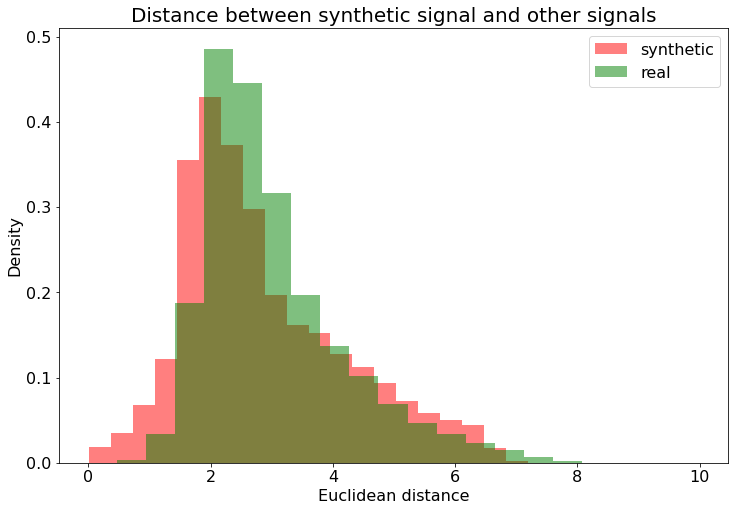

In [ ]:
n_bins = 20
plt.figure(figsize = (12, 8))
plt.hist(ds, n_bins, density = True, histtype ='bar', label='synthetic', alpha=.5, color='red',)
plt.hist(ds_real, n_bins, density = True, histtype ='bar', label='real', alpha=.5, color='green',)
plt.title('Distance between synthetic signal and other signals', fontsize =20)
plt.legend()
plt.xlabel("Euclidean distance", fontsize=16)
plt.ylabel("Density", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize =16)
plt.show()

In [ ]:
# Create 1k synthetic examples

sequence_lengths_list= [max_sequence_length]*1000
fake_noise = random_generator(1000, z_dim, sequence_lengths_list, max_sequence_length, device=device)
fake = gen(fake_noise)
fake_sup = sup(fake)
reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
synthetic_data = reconstructed_fake.squeeze().numpy()
synthetic_data.shape

(1000, 163)

### Minimum distance

In [ ]:
# Visualize generated data
titles=['Sample ' + str(n) for n in range(0, 120, 10)]
fig = make_subplots(rows=6, cols=2, subplot_titles=titles)
plot_nb = 1
i = 1
j = 1
axis_length = list(range(synthetic_data.shape[1]))
for n, data in enumerate(synthetic_data):
    if n % 10 == 0 and n<120:
      fig.append_trace(go.Scatter(
        x=axis_length,
        y=synthetic_data[n])
      , row=i, col=j)
      if j==1:
          j=2
      else:
          j=1
          i+=1

fig.update_layout(title_text=f"Synthetic data", width=700, height=1000, showlegend=False)
fig.show()

In [ ]:
# Calculate |D|synthetic

model = NearestNeighbors(n_neighbors=2, algorithm='brute', metric="cosine").fit(synthetic_data)
_, indices = model.kneighbors(synthetic_data)
indices = indices[:,1]
similarities = np.diagonal(cosine_similarity(synthetic_data, synthetic_data[indices]))
distances = np.diagonal(euclidean_distances(synthetic_data, synthetic_data[indices]))
average_max_similarity = np.mean(similarities)
print(f"cos(\u03F4)_synthetic = {round(average_max_similarity,2)}")

average_distance = np.mean(distances)
print("|D|synthetic = {:.1f}".format(round(average_distance,2)))

cos(ϴ)_synthetic = 1.0
|D|synthetic = 0.2


In [ ]:
similarities_synthetic = similarities
fig = go.Figure()
fig.add_trace(go.Histogram(x=similarities, histnorm='probability', nbinsx=20))
fig.update_layout(title_text=f"Cosine similarity between a synthetic sample and its closest synthetic sample",xaxis_title='Cosine similarity',
                   yaxis_title='Density', width=800, height=500, showlegend=False)
fig.show()

In [ ]:
# closest sample shifted up for better visualization
d_range = np.linspace(0.97,1,6)
title_subplots = []
plot_nb = 0
for n, data in enumerate(synthetic_data):
    if plot_nb < 12:
      if  d_range[plot_nb]< similarities[n]<d_range[plot_nb+1]:
        title_subplots.append("cos(\u03F4)= " + str(round(similarities[n],3)))
        plot_nb += 1


fig = make_subplots(rows=6, cols=2, subplot_titles=title_subplots)
plot_nb = 1
i = 1
j = 1
axis_length = list(range(synthetic_data.shape[1]))
plot_nb = 0
for n, data in enumerate(synthetic_data):
    if plot_nb < 12:
      if  d_range[plot_nb]< similarities[n]<d_range[plot_nb+1]:
        fig.append_trace(go.Scatter(
          x=axis_length,
          y=synthetic_data[n])
        , row=i, col=j)
        fig.append_trace(go.Scatter(
          x=axis_length,
          y=synthetic_data[indices[n]]+0.2)
        , row=i, col=j)
        if j==1:
            j=2
        else:
            j=1
            i+=1
        plot_nb += 1

fig.update_layout(title_text=f"Synthetic signal and its closest synthetic signal ", width=700, height=1000, showlegend=False)
fig.show()

In [ ]:
# Max and min distances

max_diff = np.argmax(similarities)

axis_length = list(range(synthetic_data.shape[1]))
fig = go.Figure()
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[max_diff]))
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[indices][max_diff]))
# Edit the layout
fig.update_layout(title=f'max cos(\u03F4) = {round(similarities.max(),2)}',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()


min_diff = np.argmin(similarities)

axis_length = list(range(synthetic_data.shape[1]))
fig = go.Figure()
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[min_diff]))
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[indices][min_diff]))
# Edit the layout
fig.update_layout(title=f'min cos(\u03F4) = {round(similarities.min(),2)}',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()

In [ ]:
# Visualize samples and their nearest neighbour

titles=['Sample ' + str(n) + " - cos(\u03F4)=" + str(round(similarities[n],2)) + " - d=" + str(round(distances[n],2)) for n in range(0, 120, 10)]
fig = make_subplots(rows=6, cols=2, subplot_titles=titles)
plot_nb = 1
i = 1
j = 1
axis_length = list(range(synthetic_data.shape[1]))
for n, data in enumerate(synthetic_data):
    if n % 10 == 0 and n<120:
      fig.append_trace(go.Scatter(
        x=axis_length,
        y=synthetic_data[n])
      , row=i, col=j)
      fig.append_trace(go.Scatter(
        x=axis_length,
        y=synthetic_data[indices[n]])
      , row=i, col=j)
      if j==1:
          j=2
      else:
          j=1
          i+=1

fig.update_layout(title_text=f"Synthetic signal and its closest synthetic signal", width=700, height=1000, showlegend=False)
fig.show()

In [ ]:
# Calculate |D|real

model = NearestNeighbors(n_neighbors=1, algorithm='brute', metric="cosine").fit(real_data)
_, indices = model.kneighbors(synthetic_data)
indices = indices[:,0]
similarities = np.diagonal(cosine_similarity(synthetic_data, real_data[indices]))
distances = np.diagonal(euclidean_distances(synthetic_data, real_data[indices]))
average_max_similarity = np.mean(similarities)
print(f"cos(\u03F4)_real = {round(average_max_similarity,2)}")

average_distance = np.mean(distances)
print("|D|real = {:.1f}".format(round(average_distance,2)))

cos(ϴ)_real = 0.98
|D|real = 1.0


In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=similarities_synthetic, histnorm='probability', name="synthetic", nbinsx=20))
fig.add_trace(go.Histogram(x=similarities, histnorm='probability', name='real', nbinsx=20))
fig.update_layout(title_text=f"Cosine similarity between a synthetic signal and its closest signal",xaxis_title='Cosine similarity',
                   yaxis_title='Density', width=800, height=500, showlegend=True)
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()


In [ ]:
# closest sample shifted up for better visualization
d_range = np.linspace(0.93,1,8)
title_subplots = []
plot_nb = 0
for n, data in enumerate(synthetic_data):
    if plot_nb < 12:
      if  d_range[plot_nb]< similarities[n]<d_range[plot_nb+1]:
        title_subplots.append("cos(\u03F4)= " + str(round(similarities[n],3)))
        plot_nb += 1


fig = make_subplots(rows=6, cols=2, subplot_titles=title_subplots)
i = 1
j = 1
axis_length = list(range(synthetic_data.shape[1]))
plot_nb = 0
for n, data in enumerate(synthetic_data):
    showlegend=False if plot_nb!=0 else True
    if plot_nb < 12:
      if  d_range[plot_nb]< similarities[n]<d_range[plot_nb+1]:
        fig.append_trace(go.Scatter(
          x=axis_length,
          y=synthetic_data[n], line_color="blue",
          name=" ", legendgroup="synthetic", legendgrouptitle_text="synthetic", showlegend=showlegend)
        , row=i, col=j) # blue
        fig.append_trace(go.Scatter(
          x=axis_length,
          # y=real_data[indices[n]] + 0.2, line_color="red",
          y=real_data[indices[n]], line_color="red",
          name=" ", legendgroup="real", legendgrouptitle_text="real",showlegend=showlegend)
        , row=i, col=j) # red

        if j==1:
            j=2
        else:
            j=1
            i+=1
        plot_nb += 1

fig.update_layout(title_text=f"Synthetic signal and its closest real signal ", width=700, height=1000, showlegend=True)
fig.show()

In [ ]:
# Max and min distances

max_diff = np.argmax(similarities)

axis_length = list(range(synthetic_data.shape[1]))
fig = go.Figure()
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[max_diff]))
fig.add_trace(go.Scatter(x=axis_length, y=real_data[indices][max_diff]))
# Edit the layout
fig.update_layout(title=f'max cos(\u03F4) = {round(similarities.max(),2)}',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()


min_diff = np.argmin(similarities)

axis_length = list(range(synthetic_data.shape[1]))
fig = go.Figure()
fig.add_trace(go.Scatter(x=axis_length, y=synthetic_data[min_diff]))
fig.add_trace(go.Scatter(x=axis_length, y=real_data[indices][min_diff]))
# Edit the layout
fig.update_layout(title=f'min cos(\u03F4) = {round(similarities.min(),2)}',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()

In [ ]:
# Visualize samples and their nearest neighbour

titles=['Sample ' + str(n) + " - cos(\u03F4)=" + str(round(similarities[n],2)) + " - d=" + str(round(distances[n],2)) for n in range(0, 120, 10)]
fig = make_subplots(rows=6, cols=2, subplot_titles=titles)
plot_nb = 1
i = 1
j = 1
axis_length = list(range(synthetic_data.shape[1]))
for n, data in enumerate(synthetic_data):
    if n % 10 == 0 and n<120:
      showlegend=False if n!=0 else True
      fig.append_trace(go.Scatter(
        x=axis_length,
        y=synthetic_data[n], line_color="blue",
        name=" ", legendgroup="synthetic", legendgrouptitle_text="synthetic", showlegend=showlegend)
      , row=i, col=j) # blue
      fig.append_trace(go.Scatter(
        x=axis_length,
        y=real_data[indices[n]], line_color="red",
        name=" ", legendgroup="real", legendgrouptitle_text="real",showlegend=showlegend)
      , row=i, col=j) # red
      if j==1:
          j=2
      else:
          j=1
          i+=1

fig.update_layout(title_text=f"Synthetic signal and its closest real signal", width=700, height=1000, showlegend=True)
fig.show()

### Euclidean distance

In [ ]:
# inter-patient distance
inter_patient_distances = np.array([])
patient_nb = real_data['Patient'].unique()
for patient in patient_nb:
  condition= real_data['Patient']==patient
  df_patient = real_data[condition].copy().reset_index(drop=True)
  other_patients = real_data[~condition].copy().reset_index(drop=True)
  d= euclidean_distances(df_patient.iloc[:, :-1].values, other_patients.iloc[:, :-1].values).ravel()
  # d.tofile(f'inter_patient_distances_{patient}.csv', sep = ',')
  inter_patient_distances =np.append(inter_patient_distances, d.ravel())
  del d

In [ ]:
# intra-patient distance
intra_patient_distances = np.array([])
patient_nb = real_data['Patient'].unique()
for patient in patient_nb:
  condition= real_data['Patient']==patient
  df_patient = real_data[condition].copy().reset_index(drop=True)
  d= euclidean_distances(df_patient.iloc[:, :-1].values, df_patient.iloc[:, :-1].values)
  ds = []
  for row in range(d.shape[0]):
    for col in range(d.shape[1]):
      if col>row:
        ds.append(d[row, col])
  intra_patient_distances =np.append(intra_patient_distances, np.array(ds))

In [ ]:
# synthetic-real distance
d_real = euclidean_distances(synthetic_data, real_data.iloc[:, :-1].values)


In [ ]:
# synthetic-synthetic
d = euclidean_distances(synthetic_data, synthetic_data)
ds = []
for row in range(d.shape[0]):
  for col in range(d.shape[1]):
    if col>row:
      ds.append(d[row, col])

In [ ]:
d_real.shape

(1000, 10000)

In [ ]:
intra_patient_distances.shape

(1124840,)

In [ ]:
 inter_patient_distances.shape

(97740320,)

In [ ]:
d_real.ravel().shape

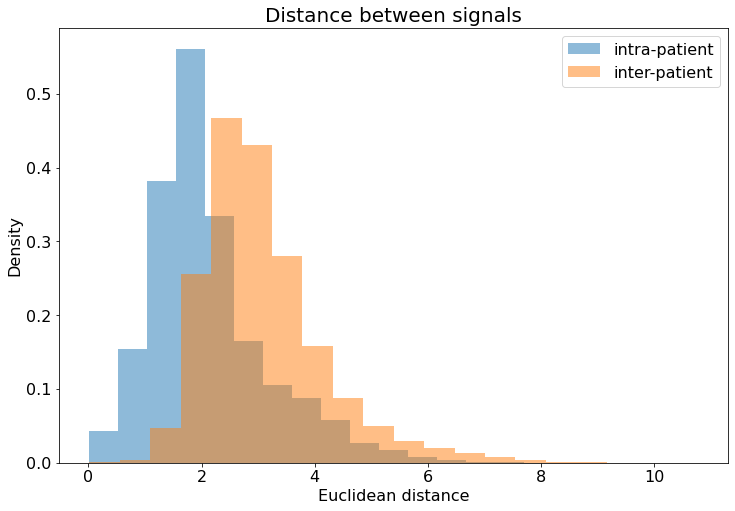

In [ ]:
n_bins = 20
plt.figure(figsize = (12, 8))
plt.hist(intra_patient_distances, n_bins, density = True, histtype ='bar', label='intra-patient', alpha=.5)
plt.hist(inter_patient_distances, n_bins, density = True, histtype ='bar', label='inter-patient', alpha=.5)
plt.title('Distance between signals', fontsize =20)
plt.legend()
plt.xlabel("Euclidean distance", fontsize=16)
plt.ylabel("Density", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize =16)
plt.show()

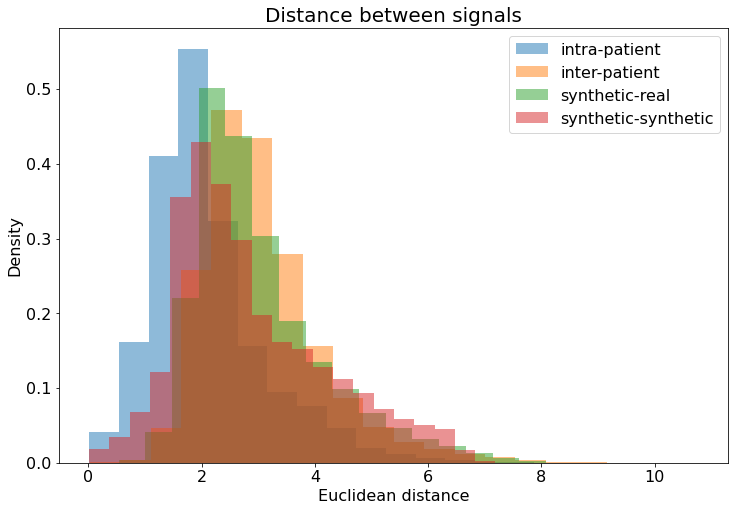

In [ ]:
n_bins = 20
plt.figure(figsize = (12, 8))
plt.hist(intra_patient_distances, n_bins, density = True, histtype ='bar', label='intra-patient', alpha=.5)
plt.hist(inter_patient_distances, n_bins, density = True, histtype ='bar', label='inter-patient', alpha=.5)
plt.hist(d_real.ravel(), n_bins, density = True, histtype ='bar', label='synthetic-real', alpha=.5)
plt.hist(ds, n_bins, density = True, histtype ='bar', label='synthetic-synthetic', alpha=.5)
plt.title('Distance between signals', fontsize =20)
plt.legend()
plt.xlabel("Euclidean distance", fontsize=16)
plt.ylabel("Density", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize =16)
plt.show()

In [ ]:
# inter-patient distance
inter_patient_distances = np.array([])
patient_nb = real_data['Patient'].unique()
for patient in patient_nb:
  condition= real_data['Patient']==patient
  df_patient = real_data[condition].copy().reset_index(drop=True)
  other_patients = real_data[~condition].copy().reset_index(drop=True)
  d= cosine_similarity(df_patient.iloc[:, :-1].values, other_patients.iloc[:, :-1].values).ravel()
  # d.tofile(f'inter_patient_distances_{patient}.csv', sep = ',')
  inter_patient_distances =np.append(inter_patient_distances, d.ravel())

In [ ]:
# intra-patient distance
intra_patient_distances = np.array([])
patient_nb = real_data['Patient'].unique()
for patient in patient_nb:
  condition= real_data['Patient']==patient
  df_patient = real_data[condition].copy().reset_index(drop=True)
  d= cosine_similarity(df_patient.iloc[:, :-1].values, df_patient.iloc[:, :-1].values)
  ds = []
  for row in range(d.shape[0]):
    for col in range(d.shape[1]):
      if col>row:
        ds.append(d[row, col])
  intra_patient_distances =np.append(intra_patient_distances, np.array(ds))

In [ ]:
# synthetic-real distance
d_real = cosine_similarity(synthetic_data, real_data.iloc[:, :-1].values)


In [ ]:
# synthetic-synthetic
d = cosine_similarity(synthetic_data, synthetic_data)
ds = []
for row in range(d.shape[0]):
  for col in range(d.shape[1]):
    if col>row:
      ds.append(d[row, col])

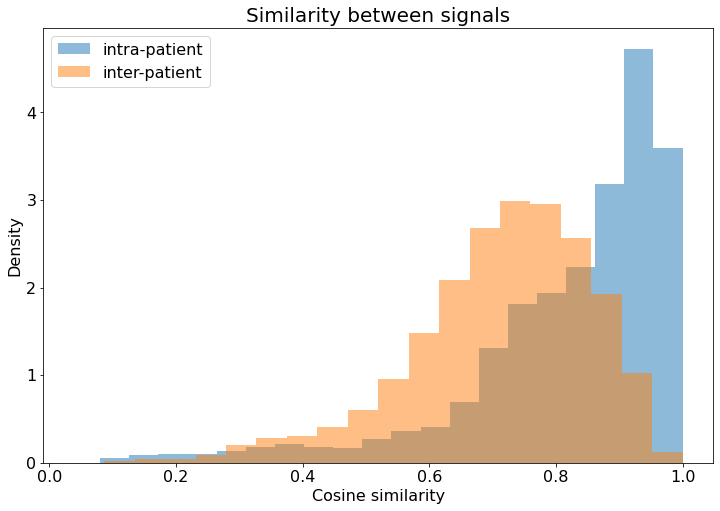

In [ ]:
n_bins = 20
plt.figure(figsize = (12, 8))
plt.hist(intra_patient_distances, n_bins, density = True, histtype ='bar', label='intra-patient', alpha=.5)
plt.hist(inter_patient_distances, n_bins, density = True, histtype ='bar', label='inter-patient', alpha=.5)
plt.title('Similarity between signals', fontsize =20)
plt.legend()
plt.xlabel("Cosine similarity", fontsize=16)
plt.ylabel("Density", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize =16)
plt.show()

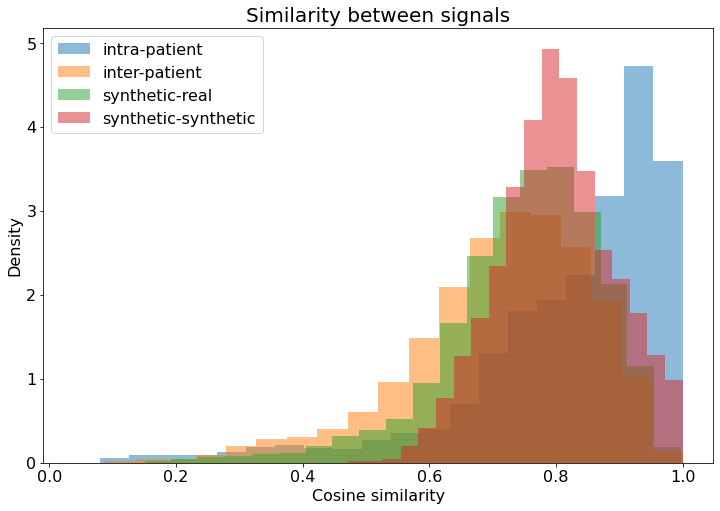

In [ ]:
n_bins = 20
plt.figure(figsize = (12, 8))
plt.hist(intra_patient_distances, n_bins, density = True, histtype ='bar', label='intra-patient', alpha=.5)
plt.hist(inter_patient_distances, n_bins, density = True, histtype ='bar', label='inter-patient', alpha=.5)
plt.hist(d_real.ravel(), n_bins, density = True, histtype ='bar', label='synthetic-real', alpha=.5)
plt.hist(ds, n_bins, density = True, histtype ='bar', label='synthetic-synthetic', alpha=.5)
plt.title('Similarity between signals', fontsize =20)
plt.legend()
plt.xlabel("Cosine similarity", fontsize=16)
plt.ylabel("Density", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize =16)
plt.show()

## PCA and TSNE analysis



In [ ]:
file_loc="/content/drive/MyDrive/Colab Notebooks/all_records_train.csv"
real_data = load_ecg_data(file_loc)
real_data.shape

(76065, 163)

In [ ]:
# Sample size for visualization = 1000
sample_size = 1000
index = np.random.choice(real_data.shape[0], sample_size, replace=False)
# real_data_samples = real_data[index]
real_data_samples = real_data[:sample_size]
real_data_samples.shape

(1000, 163)

In [ ]:
synthetic_data.shape

(1000, 163)

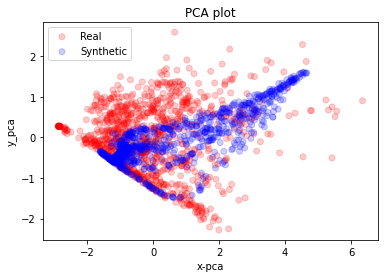

In [ ]:
# PCA fitted on real data
# Parameters
colors = ["red" for i in range(sample_size)] +  ["blue" for i in range(sample_size)]

# PCA Analysis
pca = PCA(n_components = 2)
pca.fit(real_data_samples)
pca_results = pca.transform(real_data_samples)
pca_hat_results = pca.transform(synthetic_data)

# Plotting
f, ax = plt.subplots(1)

plt.scatter(pca_results[:,0], pca_results[:,1], c = colors[:sample_size], alpha = 0.2, label = "Real")
plt.scatter(pca_hat_results[:,0], pca_hat_results[:,1], c = colors[sample_size:], alpha = 0.2, label = "Synthetic")

ax.legend()

plt.title('PCA plot')
plt.xlabel('x-pca')
plt.ylabel('y_pca')
plt.show()

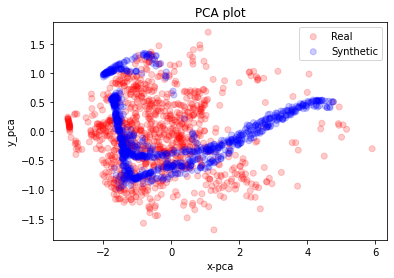

In [ ]:
# PCA fitted on synthetic data
# Parameters
colors = ["red" for i in range(sample_size)] +  ["blue" for i in range(sample_size)]

# PCA Analysis
pca = PCA(n_components = 2)
pca.fit(synthetic_data)
pca_results = pca.transform(real_data_samples)
pca_hat_results = pca.transform(synthetic_data)

# Plotting
f, ax = plt.subplots(1)

plt.scatter(pca_results[:,0], pca_results[:,1], c = colors[:sample_size], alpha = 0.2, label = "Real")
plt.scatter(pca_hat_results[:,0], pca_hat_results[:,1], c = colors[sample_size:], alpha = 0.2, label = "Synthetic")

ax.legend()

plt.title('PCA plot')
plt.xlabel('x-pca')
plt.ylabel('y_pca')
plt.show()

In [ ]:
# Do t-SNE Analysis together
final_arrayX = np.concatenate((real_data_samples, synthetic_data), axis = 0)
final_arrayX.shape

(2000, 163)

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 2000 samples in 0.002s...
[t-SNE] Computed neighbors for 2000 samples in 0.188s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2000
[t-SNE] Computed conditional probabilities for sample 2000 / 2000
[t-SNE] Mean sigma: 0.628383
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.832085
[t-SNE] KL divergence after 300 iterations: 0.803333


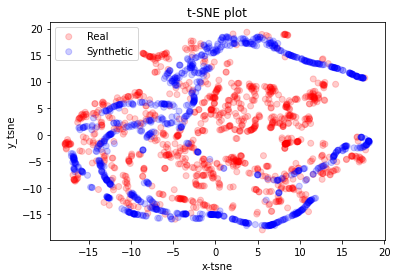

In [ ]:
# TSNE anlaysis
tsne = TSNE(n_components = 2, verbose = 1, perplexity = 40, n_iter = 300)
tsne_results = tsne.fit_transform(final_arrayX)

# Plotting
f, ax = plt.subplots(1)

plt.scatter(tsne_results[:sample_size,0], tsne_results[:sample_size,1], c = colors[:sample_size], alpha = 0.2, label = "Real")
plt.scatter(tsne_results[sample_size:,0], tsne_results[sample_size:,1], c = colors[sample_size:], alpha = 0.2, label = "Synthetic")

ax.legend()

plt.title('t-SNE plot')
plt.xlabel('x-tsne')
plt.ylabel('y_tsne')
plt.show()

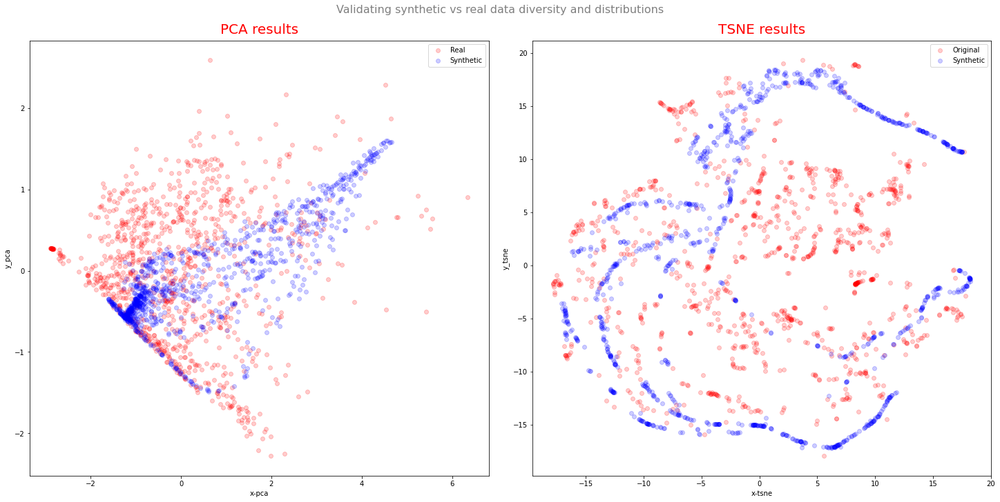

In [ ]:
#The scatter plots for PCA and TSNE methods
import matplotlib.gridspec as gridspec
fig = plt.figure(constrained_layout=True, figsize=(20,10))
spec = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)

#TSNE scatter plot
ax = fig.add_subplot(spec[0,0])
ax.set_title('PCA results',
             fontsize=20,
             color='red',
             pad=10)

#PCA scatter plot
plt.scatter(pca_results[:, 0], pca_results[:,1],
            c='red', alpha=0.2, label='Real')
plt.scatter(pca_hat_results[:,0], pca_hat_results[:,1],
            c='blue', alpha=0.2, label='Synthetic')
ax.legend()
ax.set_xlabel('x-pca')
ax.set_ylabel('y_pca')

ax2 = fig.add_subplot(spec[0,1])
ax2.set_title('TSNE results',
              fontsize=20,
              color='red',
              pad=10)

plt.scatter(tsne_results[:sample_size, 0], tsne_results[:sample_size,1],
            c='red', alpha=0.2, label='Original')
plt.scatter(tsne_results[sample_size:,0], tsne_results[sample_size:,1],
            c='blue', alpha=0.2, label='Synthetic')

ax2.legend()
ax2.set_xlabel('x-tsne')
ax2.set_ylabel('y_tsne')

fig.suptitle('Validating synthetic vs real data diversity and distributions',
             fontsize=16,
             color='grey');

## Discriminative score

### Create Datasets and Dataloaders

In [ ]:
class ECGDatasetTrain(Dataset):
    def __init__(self):

        nb_samples = 8000
        file_loc="/content/drive/MyDrive/Colab Notebooks/all_records_train.csv"
        data = load_ecg_data(file_loc, np=False)
        data["real?"]=1
        index = np.random.choice(data.shape[0], nb_samples, replace=False)
        data = data.iloc[index]
        data.reset_index(inplace=True, drop=True)
        data_real_train, data_real_val, _, _ = train_test_split(data,[1]*len(data), test_size = 0.25, random_state = 99)
        data_real_train.reset_index(inplace=True, drop=True)
        data_real_val.reset_index(inplace=True, drop=True)

        # synthetic train
        max_sequence_length = 163
        sequence_lengths_list= [max_sequence_length]*int(0.75*nb_samples)
        fake_noise = random_generator(int(0.75*nb_samples), z_dim, sequence_lengths_list, max_sequence_length, device=device)
        fake = gen(fake_noise)
        fake_sup = sup(fake)
        reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
        data_synthetic = reconstructed_fake.squeeze().numpy()
        data_synthetic_train = pd.DataFrame(data_synthetic)
        data_synthetic_train["real?"]=0

        # synthetic validation
        sequence_lengths_list= [max_sequence_length]*int(0.25*nb_samples)
        fake_noise = random_generator(int(0.25*nb_samples), z_dim, sequence_lengths_list, max_sequence_length, device=device)
        fake = gen(fake_noise)
        fake_sup = sup(fake)
        reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
        data_synthetic = reconstructed_fake.squeeze().numpy()
        data_synthetic_val = pd.DataFrame(data_synthetic)
        data_synthetic_val["real?"]=0

        self.data_df = pd.concat([data_real_train, data_synthetic_train])
        self.data_df_val = pd.concat([data_real_val, data_synthetic_val])

        data = self.data_df.drop(['real?'], axis = 1).to_numpy()
        data = np.expand_dims(data, axis=(2))
        labels = self.data_df['real?'].to_numpy()
        max_sequence_length = data.shape[1]

        self.data = torch.from_numpy(np.array(data)).float().to(device)
        self.labels = torch.from_numpy(np.array(labels)).float().to(device)
        self.features_per_timestep = data.shape[2]
        self.max_sequence_length = max_sequence_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):

        return self.data[idx], self.labels[idx], 163

In [ ]:
class ECGDatasetVal(Dataset):
    def __init__(self, data_df_val):

        data = data_df_val.drop(['real?'], axis = 1).to_numpy()
        data = np.expand_dims(data, axis=(2))
        labels = data_df_val['real?'].to_numpy()
        max_sequence_length = data.shape[1]

        self.data = torch.from_numpy(np.array(data)).float().to(device)
        self.labels = torch.from_numpy(np.array(labels)).float().to(device)
        self.features_per_timestep = data.shape[2]
        self.max_sequence_length = max_sequence_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):

        return self.data[idx], self.labels[idx], 163

In [ ]:
class ECGDatasetTest(Dataset):
    def __init__(self):
        nb_samples = 2000
        file_loc="/content/drive/MyDrive/Colab Notebooks/all_records_test.csv"
        data_real_test = load_ecg_data(file_loc, np=False)
        index = np.random.choice(data_real_test.shape[0], nb_samples, replace=False)
        data_real_test = data_real_test.iloc[index]
        data_real_test.reset_index(inplace=True, drop=True)
        data_real_test["real?"]=1

        # synthetic test
        max_sequence_length = data_real_test.shape[1]-1
        sequence_lengths_list= [max_sequence_length]*nb_samples
        fake_noise = random_generator(nb_samples, z_dim, sequence_lengths_list, max_sequence_length, device=device)
        fake = gen(fake_noise)
        fake_sup = sup(fake)
        reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
        data_synthetic = reconstructed_fake.squeeze().numpy()
        data_synthetic_test = pd.DataFrame(data_synthetic)
        data_synthetic_test["real?"]=0

        self.data_df_test = pd.concat([data_real_test, data_synthetic_test])

        data = self.data_df_test.drop(['real?'], axis = 1).to_numpy()
        data = np.expand_dims(data, axis=(2))
        labels = self.data_df_test['real?'].to_numpy()


        self.data = torch.from_numpy(np.array(data)).float().to(device)
        self.labels = torch.from_numpy(np.array(labels)).float().to(device)
        self.max_sequence_length = max_sequence_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):

        return self.data[idx], self.labels[idx], 163

In [ ]:
batch_size=128

train_data_discriminative = ECGDatasetTrain()
train_dataloader_discriminative = DataLoader(train_data_discriminative, batch_size=batch_size, shuffle=True)
train_data, label_train, _ = next(iter(train_dataloader_discriminative))

val_data_discriminative = ECGDatasetVal(train_data_discriminative.data_df_val)
val_dataloader_discriminative = DataLoader(val_data_discriminative, batch_size=batch_size, shuffle=True)

test_data_discriminative = ECGDatasetTest()
test_dataloader_discriminative = DataLoader(test_data_discriminative, batch_size=batch_size, shuffle=True)
test_data, label_test, _ = next(iter(test_dataloader_discriminative))

print("data_train shape: {}".format(train_data_discriminative.data.shape))
print("data_val shape: {}".format(val_data_discriminative.data.shape))
print("data_test shape: {}".format(test_data_discriminative.data.shape))

fig = go.Figure()
for i in range(10):
    color = "blue" if label_train[i]==0 else "red"
    name = "synthetic" if color=="blue" else "real"
    fig.add_trace(go.Scatter(x=list(range(train_data[0].shape[0])), y=train_data.cpu().squeeze()[i],
                    mode='lines', line=dict(color=color), name=name ))

labels_to_show_in_legend = ["real", "synthetic"]
reals=0
synthetics=0
for trace in fig['data']:
    if trace['name']=="real":
        trace['showlegend'] = False if reals!=0 else True
        reals=1
    elif trace['name']=="synthetic":
        trace['showlegend'] = False if synthetics!=0 else True
        synthetics=1

# Edit the layout
fig.update_layout(title='Real Signals - Train data',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()


fig = go.Figure()
for i in range(10):
    color = "blue" if label_test[i]==0 else "red"
    name = "synthetic" if color=="blue" else "real"
    fig.add_trace(go.Scatter(x=list(range(train_data[0].shape[0])), y=test_data.cpu().squeeze()[i],
                    mode='lines', line=dict(color=color), name=name ))

labels_to_show_in_legend = ["real", "synthetic"]
reals=0
synthetics=0
for trace in fig['data']:
    if trace['name']=="real":
        trace['showlegend'] = False if reals!=0 else True
        reals=1
    elif trace['name']=="synthetic":
        trace['showlegend'] = False if synthetics!=0 else True
        synthetics=1

# Edit the layout
fig.update_layout(title='Real Signals - Test data',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()


data_train shape: torch.Size([12000, 163, 1])
data_val shape: torch.Size([4000, 163, 1])
data_test shape: torch.Size([4000, 163, 1])


In [ ]:
train_data_discriminative.data_df

,0,1,2,3,4,5,6,7,8,9,...,154,155,156,157,158,159,160,161,162,real?
0,0.563161,0.867881,0.851300,0.478783,0.181832,0.119195,0.120203,0.106931,0.086243,0.075016,...,-3.179407e-08,5.887192e-08,-6.366569e-08,5.101062e-08,-2.882463e-08,5.309977e-09,1.315620e-08,-2.309917e-08,2.400796e-08,1
1,0.602721,0.820651,0.936104,0.745629,0.410265,0.264194,0.238902,0.211955,0.211999,0.207607,...,3.920590e-07,-8.695463e-07,9.965886e-07,-8.362198e-07,5.067090e-07,-1.373019e-07,-1.667574e-07,3.436448e-07,-3.782455e-07,1
2,0.487979,0.646642,0.794066,0.890159,0.907033,0.833338,0.580054,0.384035,0.418343,0.424086,...,6.808306e-07,-4.288012e-07,1.379002e-07,1.080833e-07,-2.591291e-07,3.024077e-07,-2.555042e-07,1.539539e-07,-3.787757e-08,1
3,0.660215,0.802579,0.910825,0.932448,0.822051,0.644028,0.538499,0.511753,0.486289,0.462670,...,1.587376e-07,-5.233771e-08,-3.802431e-08,9.394388e-08,-1.106039e-07,9.433684e-08,-5.807002e-08,1.638473e-08,1.844057e-08,1
4,0.539406,0.874190,0.608779,0.139563,0.048180,0.078792,0.081313,0.099891,0.081887,0.088821,...,-1.009822e-06,6.162469e-07,-1.754284e-07,-1.888252e-07,4.051625e-07,-4.584214e-07,3.783462e-07,-2.202550e-07,4.486883e-08,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.588967,0.668056,0.690261,0.717826,0.706890,0.583265,0.447387,0.434431,0.460518,0.440345,...,2.155193e-04,1.610793e-04,2.154532e-04,1.602484e-04,2.149396e-04,1.595616e-04,2.145033e-04,1.588481e-04,2.146586e-04,0
5996,0.587738,0.888045,0.701821,0.036472,0.000860,0.114044,0.308963,0.301408,0.299106,0.295825,...,2.641721e-04,1.567048e-04,2.669447e-04,1.565308e-04,2.692313e-04,1.563333e-04,2.711192e-04,1.561928e-04,2.746944e-04,0
5997,0.588920,0.668654,0.660456,0.739460,0.597216,0.462467,0.304207,0.266015,0.259935,0.235983,...,2.766594e-04,1.606930e-04,2.780861e-04,1.602049e-04,2.787601e-04,1.597622e-04,2.795479e-04,1.593728e-04,2.816146e-04,0
5998,0.589016,0.667069,0.808533,0.625797,0.383197,0.208470,0.263745,0.308090,0.279021,0.244581,...,1.619479e-04,2.314036e-04,1.609172e-04,2.307264e-04,1.604633e-04,2.314859e-04,1.598477e-04,2.314215e-04,1.591251e-04,0


### Create and train model

In [ ]:
# Discriminator

class Classifier(nn.Module):

    def __init__(self, nb_features, hidden_dim, num_layers=1, activation=False):

        super().__init__()

        self.activation = activation

        self.rnn = nn.GRU(nb_features, hidden_dim, num_layers=num_layers, batch_first=True, bidirectional=False)

        self.fc = nn.Linear(hidden_dim, 1)

        self.sigmoid = nn.Sigmoid()

        with torch.no_grad():
            for name, param in self.rnn.named_parameters():
                if 'weight_ih' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'weight_hh' in name:
                    torch.nn.init.xavier_uniform_(param.data)
                elif 'bias_ih' in name:
                    param.data.fill_(1)
                elif 'bias_hh' in name:
                    param.data.fill_(0)
            for name, param in self.fc.named_parameters():
                if 'weight' in name:
                    torch.nn.init.xavier_uniform_(param)
                elif 'bias' in name:
                    param.data.fill_(0)

    def forward(self, data):

        output, hidden = self.rnn(data)

        if self.activation:
            return torch.mean(self.sigmoid(self.fc(output)), dim=1)

        return torch.mean(self.fc(output), dim=1)

In [ ]:
def get_accuracy(dataloader, classifier):
    sigmoid = nn.Sigmoid()
    correct = 0
    total = 0
    # since we're not training, we don't need to calculate the gradients for our outputs
    with torch.no_grad():
        for data in dataloader:
            test_data, label, _  = data
            # calculate outputs by running images through the network
            outputs = classifier(test_data)
            # the class with the highest energy is what we choose as prediction
            predicted = torch.round(sigmoid(outputs)).squeeze()
            total += label.size(0)
            correct += (predicted == label).sum().item()
    accuracy = correct / total

    return accuracy

In [ ]:
def create_train_classifier():

  epochs = 200 # original code uses 16 epochs (2000/128)
  batch_size = 128

  train_data_discriminative = ECGDatasetTrain()
  train_dataloader_discriminative = DataLoader(train_data_discriminative, batch_size=batch_size, shuffle=True)

  val_data_discriminative = ECGDatasetVal(train_data_discriminative.data_df_val)
  val_dataloader_discriminative = DataLoader(val_data_discriminative, batch_size=batch_size, shuffle=True)

  # Network Parameters
  hidden_dim = max(int(train_data_discriminative.max_sequence_length/2),1) # 82
  criterion = nn.BCEWithLogitsLoss()
  classifier = Classifier(1, hidden_dim).to(device)
  opt = torch.optim.Adam(classifier.parameters())

  min_valid_loss = np.inf
  mean_epoch_losses_train = list()
  mean_epoch_losses_val = list()
  accuracy_train = list()
  accuracy_val = list()

  for epoch in tqdm(range(epochs)):  # loop over the dataset multiple times

      running_loss = 0.0
      classifier.train()
      for i, data in enumerate(train_dataloader_discriminative, 0):
          # get the inputs; data is a list of [inputs, labels]
          inputs, labels, _ = data

          # zero the parameter gradients
          opt.zero_grad()

          # forward + backward + optimize
          outputs = classifier(inputs)
          loss = criterion(outputs.squeeze(), labels)
          loss.backward()
          opt.step()

          # print statistics
          running_loss += loss.item()

      valid_loss = 0.0
      classifier.eval()     # Optional when not using Model Specific layer
      for i, data in enumerate(val_dataloader_discriminative, 0):
          inputs, labels, _ = data

          # Forward Pass
          outputs = classifier(inputs)
          # Find the Loss
          loss = criterion(outputs.squeeze(), labels)
          # Calculate Loss
          valid_loss += loss.item()


      if min_valid_loss > valid_loss:
          # print(f'Validation Loss Decreased({min_valid_loss:.3f}\
          # -->{valid_loss:.3f}) \t Saving The Model')
          min_valid_loss = valid_loss

          # Saving State Dict
          best_model_params = deepcopy(classifier.state_dict())
          torch.save(classifier.state_dict(), 'discriminative_classifier.pth')

      # print(f'[{epoch + 1}] Training loss: {running_loss / len(train_dataloader_discriminative):.3f} \
      # \t|  Validation Loss: {valid_loss / len(val_dataloader_discriminative):.3f}')

      # Mean loss per sample for 1 epoch
      mean_epoch_losses_train.append(running_loss / len(train_dataloader_discriminative))
      # Mean loss per sample for 1 epoch
      mean_epoch_losses_val.append(valid_loss / len(val_dataloader_discriminative))
      # Accuracy
      accuracy_train.append(get_accuracy(train_dataloader_discriminative, classifier))
      accuracy_val.append(get_accuracy(val_dataloader_discriminative, classifier))

  classifier.load_state_dict(best_model_params)
  print('Finished Training')

  df_losses = pd.DataFrame(list(zip(mean_epoch_losses_train, mean_epoch_losses_val)),
                          columns =['Train', 'Validation' ])

  fig = go.Figure()
  for col in df_losses.columns:
    fig.add_trace(go.Scatter(x=df_losses.index, y=df_losses[col],
                      mode='lines',
                      name=col))

  # Edit the layout
  fig.update_layout(title='Classifier Losses',
                  xaxis_title='Epoch',
                  yaxis_title='Mean Loss per sample', width=800, height=500)
  fig.show()

  df_accuracies = pd.DataFrame(list(zip(accuracy_train, accuracy_val)),
                          columns =['Train', 'Validation' ])

  fig = go.Figure()
  for col in df_accuracies.columns:
    fig.add_trace(go.Scatter(x=df_accuracies.index, y=df_accuracies[col],
                      mode='lines',
                      name=col))

  # Edit the layout
  fig.update_layout(title='Classifier Accuracy',
                  xaxis_title='Epoch',
                  yaxis_title='Accuracy',width=800, height=500)
  fig.show()
  return classifier

In [ ]:
def test_classifier(classifier):

    batch_size = 128
    test_data_discriminative = ECGDatasetTest()
    test_dataloader_discriminative = DataLoader(test_data_discriminative, batch_size=batch_size, shuffle=True)

    accuracy = get_accuracy(test_dataloader_discriminative, classifier)

    return accuracy

In [ ]:
def get_disc_score():

    discriminative_scores = list()
    for iteration in range(3):
      classifier = create_train_classifier()
      accuracy = test_classifier(classifier)
      discriminative_score = round(accuracy,2)
      print("Accuracy on test data: ", discriminative_score)
      discriminative_scores.append(discriminative_score)

    return discriminative_scores, np.mean(discriminative_scores)

In [ ]:
get_disc_score()

  0%|          | 0/200 [00:00<?, ?it/s]

Finished Training


Accuracy on test data:  1.0


  0%|          | 0/200 [00:00<?, ?it/s]

Finished Training


Accuracy on test data:  0.99


  0%|          | 0/200 [00:00<?, ?it/s]

Finished Training


Accuracy on test data:  1.0


([1.0, 0.99, 1.0], 0.9966666666666667)

## Inception score

### Create and Train classifier

Classifier code adapted from: https://www.kaggle.com/code/mahbodissaiy/ecg-cnn-98-6-accuracy

In [ ]:
# Load data and compute class imbalance

file_loc="/content/drive/MyDrive/Colab Notebooks/all_records_train.csv"
real_data = load_ecg_data(file_loc, np=False, drop_class=False)
display(real_data['Class'].value_counts().to_frame())
real_data['Class'].value_counts(normalize=True).to_frame()

,Class
N,63254
Q,5397
V,4894
S,1972
F,548


,Class
N,0.831578
Q,0.070952
V,0.064340
S,0.025925
F,0.007204


In [ ]:
real_data.head()

,0,1,2,3,4,5,6,7,8,9,...,154,155,156,157,158,159,160,161,162,Class
0,0.475335,0.833435,0.774038,0.220200,0.026757,0.095626,0.072595,0.124327,0.135754,0.140555,...,1.278250e-03,-3.273195e-03,3.001007e-03,-2.323476e-03,1.542278e-03,-6.172975e-04,-2.695746e-04,8.994362e-04,-1.126183e-03,N
1,0.658278,0.826456,0.614924,0.192536,0.160703,0.305804,0.271035,0.245303,0.255133,0.255188,...,3.867834e-06,-2.737157e-06,1.226989e-06,1.795092e-07,-1.154903e-06,1.567372e-06,-1.461024e-06,9.979395e-07,-3.875645e-07,N
2,0.513121,0.702389,0.861512,0.957518,0.605550,0.127980,0.029222,0.075567,0.084435,0.078497,...,-5.014304e-08,2.864366e-07,-3.855830e-07,3.598044e-07,-2.494054e-07,1.052107e-07,2.685063e-08,-1.157131e-07,1.486879e-07,N
3,0.825185,0.950476,0.786143,0.499766,0.367710,0.403663,0.443177,0.479129,0.521365,0.518448,...,3.235482e-06,-1.660562e-06,9.966869e-08,1.057968e-06,-1.628841e-06,1.625807e-06,-1.202332e-06,5.771439e-07,3.593986e-08,N
4,0.618481,0.871496,0.855821,0.607200,0.227216,0.039390,0.138879,0.186882,0.207490,0.263676,...,-2.177606e-06,5.885606e-07,7.122797e-07,-1.475509e-06,1.653641e-06,-1.358878e-06,7.925410e-07,-1.717660e-07,-3.270639e-07,N


In [ ]:
#make a dictionary to map the target indices to class names
class_names = {0: 'N', 1: 'S', 2: 'V', 3: 'F', 4: 'Q'}
class_nbs = {'N':0 , 'S':1 ,'V': 2 , 'F':3 , 'Q':4 }

def name_to_nb(df):
  df['Class'] = df['Class'].map(lambda c: class_nbs[c])
  return df

name_to_nb(real_data)
real_data.head()

,0,1,2,3,4,5,6,7,8,9,...,154,155,156,157,158,159,160,161,162,Class
0,0.475335,0.833435,0.774038,0.220200,0.026757,0.095626,0.072595,0.124327,0.135754,0.140555,...,1.278250e-03,-3.273195e-03,3.001007e-03,-2.323476e-03,1.542278e-03,-6.172975e-04,-2.695746e-04,8.994362e-04,-1.126183e-03,0
1,0.658278,0.826456,0.614924,0.192536,0.160703,0.305804,0.271035,0.245303,0.255133,0.255188,...,3.867834e-06,-2.737157e-06,1.226989e-06,1.795092e-07,-1.154903e-06,1.567372e-06,-1.461024e-06,9.979395e-07,-3.875645e-07,0
2,0.513121,0.702389,0.861512,0.957518,0.605550,0.127980,0.029222,0.075567,0.084435,0.078497,...,-5.014304e-08,2.864366e-07,-3.855830e-07,3.598044e-07,-2.494054e-07,1.052107e-07,2.685063e-08,-1.157131e-07,1.486879e-07,0
3,0.825185,0.950476,0.786143,0.499766,0.367710,0.403663,0.443177,0.479129,0.521365,0.518448,...,3.235482e-06,-1.660562e-06,9.966869e-08,1.057968e-06,-1.628841e-06,1.625807e-06,-1.202332e-06,5.771439e-07,3.593986e-08,0
4,0.618481,0.871496,0.855821,0.607200,0.227216,0.039390,0.138879,0.186882,0.207490,0.263676,...,-2.177606e-06,5.885606e-07,7.122797e-07,-1.475509e-06,1.653641e-06,-1.358878e-06,7.925410e-07,-1.717660e-07,-3.270639e-07,0


In [ ]:
#plot the first 5 ecg signals in the dataset and their corresponding labels
x_axis = list(range(real_data.shape[1]))
fig = go.Figure()
for i in range(5):
    fig.add_trace(go.Scatter(x=x_axis, y=real_data.iloc[i, :-1],
                    mode='lines', name=class_names[real_data.iloc[i, -1]]))

# Edit the layout
fig.update_layout(title='Real Data Samples',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()

In [ ]:
# Data pre-processing

y_df = real_data.iloc[:, -1]
y_df = y_df.astype('int')
X_df = real_data.iloc[:, :-1]
X_df = X_df.astype('float')

X_np = X_df.to_numpy()
X_np = X_np.reshape(-1, 1, real_data.shape[1]-1)
y_np = y_df.to_numpy()
y_np = y_np.reshape(-1, 1)

X_mean = X_np.mean()
X_std = X_np.std()
X_max = X_np.max()
X_min = X_np.min()
print(f'mean before normalization: {X_mean}')
print(f'std: {X_std}')
print(f'max: {X_max}')

#we need to subtract the mean from the data
X_norm = X_np - X_mean
#then multiply by 1/std to make the std = 1
X_norm *= 1/X_std

print(X_norm.shape)
print(f'new mean is {X_norm.mean()}')
print(f'new std is {X_norm.std()}')

#shuffle the data and split into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_norm, y_np, test_size=0.2, shuffle=True, random_state=42)

print()
print(f'Frequency of each class in the train set')
y_train_df = pd.DataFrame(y_train)
display(y_train_df.value_counts(normalize=True).to_frame())
display(y_train_df.value_counts().to_frame())
print(f'Frequency of each class in the validation set')
y_val_df = pd.DataFrame(y_val)
display(y_val_df.value_counts(normalize=True).to_frame())
y_val_df.value_counts().to_frame()

mean before normalization: 0.21457900740722866
std: 0.22351469937700652
max: 1.08083100499049
(76065, 1, 163)
new mean is -4.096857675730036e-16
new std is 0.9999999999999984

Frequency of each class in the train set


,0
0,
0,0.830918
4,0.070910
2,0.064649
1,0.026228
3,0.007296


,0
0,
0,50563
4,4315
2,3934
1,1596
3,444


Frequency of each class in the validation set


,0
0,
0,0.834221
4,0.071123
2,0.063104
1,0.024716
3,0.006836


,0
0,
0,12691
4,1082
2,960
1,376
3,104


In [ ]:
hyper_params = {'bs': 1024,
                'lr': 1e-3,
                'lr_decay': 0.3,
                'epochs':200,
                }

#pytorch dataset and dataloader
train_ds = torch.utils.data.TensorDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
val_ds = torch.utils.data.TensorDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
len(train_ds), len(val_ds)

(60852, 15213)

In [ ]:
# the class distribution is not uniform so we have to define weights for each class
class_dist = np.unique(y_train, return_counts=True)[1] #index 1 returns the counts
class_dist = class_dist/np.sum(class_dist) #normalize to get 0-1 values
# normalize the weights
weights = 1/class_dist #invert to compensate for class distribution imbalance
weights = weights/weights.sum() #normalize to get values 0-1
print(weights, class_names)

#get weights for each example in the dataset
data_weights = np.zeros(y_train.shape[0]) #shape (m, )
for i in range(y_train.shape[0]): #for each example we assign the corresponding weight
    data_weights[i] = weights[y_train[i, 0]]
print(data_weights[:10])

#data loader - we use the random weights sampler to balance the classes
train_dl = DataLoader(train_ds, batch_size=hyper_params['bs'], sampler=WeightedRandomSampler(weights=data_weights, num_samples= len(y_train), replacement=True))
val_dl = DataLoader(val_ds, batch_size=hyper_params['bs'])

#get the class distribution in dataloader
for batch in train_dl:
    print(batch[1].shape)
    unique, counts = np.unique(batch[1], return_counts=True)
    for i in range(len(unique)):
        print(f'{class_names[unique[i]]}: {counts[i]}')
    break

[0.00584343 0.18512602 0.07510451 0.66545301 0.06847303] {0: 'N', 1: 'S', 2: 'V', 3: 'F', 4: 'Q'}
[0.06847303 0.18512602 0.00584343 0.00584343 0.00584343 0.00584343
 0.00584343 0.06847303 0.00584343 0.07510451]
torch.Size([1024, 1])
N: 211
S: 197
V: 212
F: 199
Q: 205


In [ ]:
#sample random batch from the train dataloader and plot the first 5 ecg signals in the batch
x, y = next(iter(train_dl))
x_axis = list(range(real_data.shape[1]))
fig = go.Figure()
for i in range(5):
    fig.add_trace(go.Scatter(x=x_axis, y=x[i, 0, :],
                    mode='lines', name=class_names[y[i].item()]))

# Edit the layout
fig.update_layout(title='Real Data Samples',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()

In [ ]:
# Step 1 - train a classifier
#make some convolutional blocks to use in the model
def nin_block(in_channels, out_channels, kernel_size, padding, strides):
    return nn.Sequential(
        nn.Conv1d(in_channels, out_channels, kernel_size, strides, padding),
        nn.BatchNorm1d(out_channels),
        nn.GELU(),
        nn.Conv1d(out_channels, out_channels, kernel_size=1), nn.GELU(),
        nn.Conv1d(out_channels, out_channels, kernel_size=1), nn.GELU()
    )


def get_model():
    return nn.Sequential( #input shape: (batch_size, 1, 163)
        nin_block(1, 48, kernel_size=11, strides=4, padding=0), #output shape: (batch_size, 48, 44)
        nn.MaxPool1d(3, stride=2), #output shape: (batch_size, 48, 21)
        nin_block(48, 128, kernel_size=5, strides=1, padding=2), #output shape: (batch_size, 128, 21)
        nn.MaxPool1d(3, stride=2), #output shape: (batch_size, 128, 10)
        nin_block(128, 256, kernel_size=3, strides=1, padding=1), #output shape: (batch_size, 256, 10)
        nn.MaxPool1d(3, stride=2), #output shape: (batch_size, 256, 4)
        nn.Dropout(0.4),
        #last layers for classification of 5 classes
        nin_block(256, 5, kernel_size=3, strides=1, padding=1), #output shape: (batch_size, 5, 4)
        nn.AdaptiveAvgPool1d(1), #output shape: (batch_size, 5, 1)
        nn.Flatten() #output shape: (batch_size, 5)
    )

In [ ]:
def train(model, criterion, optimizer, train_dl, val_dl, epochs, lr_scheduler: StepLR=None):
    """trains the model for the given number of epochs

    Args:
        model (nn.Module): nn model
        criterion (nn.CELoss): loss function
        optimizer (torch.optim): optimizer
        train_dl (Dataloader): training dataloader
        val_dl (Dataloader): validation dataloader
        epochs (int): number of epochs to train for
        lr_scheduler (StepLR): learning rate scheduler to adjust lr during training
    Returns:
        list of training losses and validation losses, best model parameters, best accuracy
    """
    train_losses = []
    val_losses = []
    best_model_params = deepcopy(model.state_dict())
    best_accuracy = 0.0
    for epoch in tqdm(range(epochs)):
        # print(f'Epoch {epoch+1}/{epochs}')
        # print('-'*10)
        train_loss = 0
        val_loss = 0
        model.train() #set the model to training mode
        for x, y in train_dl: #x: (batch_size, 1, 187), y: (batch_size, 1)
            x = x.to(device)
            y = y.to(device)
            optimizer.zero_grad()
            output = model(x) #the output shape is (batch_size, 5) so it's a distribution over the 5 classes
            loss = criterion(output, y.squeeze())
            loss.backward()
            optimizer.step()
            train_loss += loss.item()*x.size(0)
        train_loss = train_loss/len(train_dl.dataset)
        train_losses.append(train_loss)
        lr_scheduler.step() #update the learning rate every n epochs
        model.eval() #set the model to evaluation mode
        corrects = 0 #in order to calculate accuracy we store the number of correct predictions
        for x, y in val_dl:
            x = x.to(device)
            y = y.to(device)
            output = model(x) #out shape: (batch_size, 5)
            loss = criterion(output, y.squeeze())
            val_loss += loss.item()*x.size(0)
            #calculate the number of correct predictions
            corrects += torch.sum(torch.argmax(output, dim=1) == y.squeeze()).item()
        val_loss = val_loss/len(val_dl.dataset)
        accuracy = corrects/len(val_dl.dataset)
        val_losses.append(val_loss)
        print(f'Train Loss: {train_loss:.4f} \t Val Loss: {val_loss:.4f} \t Val Accuracy: {accuracy:.4f}')
        #if the model performs better on the validation set, save the model parameters
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_model_params = deepcopy(model.state_dict())
    print('Finished Training and the best accuracy is: {:.4f}'.format(best_accuracy))
    return train_losses, val_losses, best_model_params, best_accuracy

#confusion matrix function
def plot_cm(model, dl, categories, normalize=None):
    #plot the confusion matrix
    model.eval()
    y_pred = []
    y_true = []
    for x, y in dl:
        x = x.to(device)
        y = y.to(device)
        output = model(x) #out shape: (batch_size, 5)
        y_pred.extend(torch.argmax(output, dim=1).cpu().numpy())
        y_true.extend(y.cpu().numpy())
    cm = confusion_matrix(y_true, y_pred, normalize=normalize)
    sns.heatmap(cm, annot=True, fmt= '.2f', cmap='Blues', xticklabels=categories.values(), yticklabels=categories.values())
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()
    print(classification_report(y_true, y_pred, target_names=class_names.values()))

In [ ]:
model = get_model()
model = model.to(device)
print(f'Model size: {sum(p.numel() for p in model.parameters() if p.requires_grad)*4/(1024**2)} MB')
#number of trainable parameters
print(f'Number of trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad)}')

#loss function
criterion = nn.CrossEntropyLoss(weight=torch.tensor([1, 1.1, 2.5, 3, 1], dtype=torch.float, device=device)) #CE loss automatically uses indices as targets
#optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=hyper_params['lr'])
#lr_scheduler
lr_scheduler = StepLR(optimizer, step_size=10, gamma=hyper_params['lr_decay'], verbose=False)

train_losses, val_losses, best_model_params, best_accuracy = train(model, criterion, optimizer, train_dl, val_dl, hyper_params['epochs'], lr_scheduler)

df_losses = pd.DataFrame(list(zip(train_losses, val_losses)),
                        columns =['Train', 'Validation' ])

fig = go.Figure()
for col in df_losses.columns:
  fig.add_trace(go.Scatter(x=df_losses.index, y=df_losses[col],
                    mode='lines',
                    name=col))

# Edit the layout
fig.update_layout(title='Classifier Losses',
                xaxis_title='Epoch',
                yaxis_title='Mean Loss per sample')
fig.show()


Model size: 1.1599540710449219 MB
Number of trainable parameters: 304075


  0%|          | 0/200 [00:00<?, ?it/s]

Epoch 1/200
----------
Train Loss: 1.4857 	 Val Loss: 1.5475 	 Val Accuracy: 0.0824
Epoch 2/200
----------
Train Loss: 1.3310 	 Val Loss: 1.4569 	 Val Accuracy: 0.1373
Epoch 3/200
----------
Train Loss: 1.0586 	 Val Loss: 1.3729 	 Val Accuracy: 0.1410
Epoch 4/200
----------
Train Loss: 0.7422 	 Val Loss: 1.3104 	 Val Accuracy: 0.1476
Epoch 5/200
----------
Train Loss: 0.5495 	 Val Loss: 1.1688 	 Val Accuracy: 0.9086
Epoch 6/200
----------
Train Loss: 0.4423 	 Val Loss: 1.0606 	 Val Accuracy: 0.7688
Epoch 7/200
----------
Train Loss: 0.3752 	 Val Loss: 0.9375 	 Val Accuracy: 0.1643
Epoch 8/200
----------
Train Loss: 0.3190 	 Val Loss: 0.8657 	 Val Accuracy: 0.1627
Epoch 9/200
----------
Train Loss: 0.2774 	 Val Loss: 0.8012 	 Val Accuracy: 0.1637
Epoch 10/200
----------
Train Loss: 0.2489 	 Val Loss: 0.7571 	 Val Accuracy: 0.1630
Epoch 11/200
----------
Train Loss: 0.2307 	 Val Loss: 0.7387 	 Val Accuracy: 0.1641
Epoch 12/200
----------
Train Loss: 0.2242 	 Val Loss: 0.7318 	 Val Accura

In [ ]:
model = get_model()
model = model.to(device)
print(f'Model size: {sum(p.numel() for p in model.parameters() if p.requires_grad)*4/(1024**2)} MB')
#number of trainable parameters
print(f'Number of trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad)}')


best_checkpoint_path = "best_inception_model0.99.pt"
# model.load_state_dict(torch.load(best_checkpoint_path))
model.load_state_dict(torch.load(best_checkpoint_path, map_location=torch.device('cpu')))


Model size: 1.1599540710449219 MB
Number of trainable parameters: 304075


<All keys matched successfully>

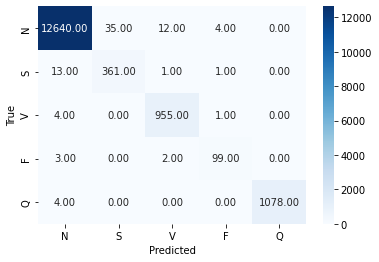

              precision    recall  f1-score   support

           N       1.00      1.00      1.00     12691
           S       0.91      0.96      0.94       376
           V       0.98      0.99      0.99       960
           F       0.94      0.95      0.95       104
           Q       1.00      1.00      1.00      1082

    accuracy                           0.99     15213
   macro avg       0.97      0.98      0.97     15213
weighted avg       0.99      0.99      0.99     15213



In [ ]:
#plot the confusion matrix using the validation set
plot_cm(model, val_dl, class_names)

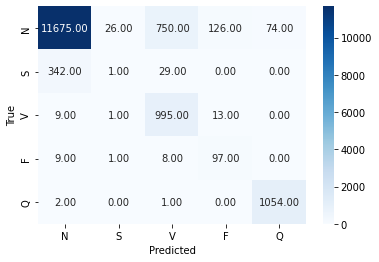

              precision    recall  f1-score   support

           N       0.97      0.92      0.95     12651
           S       0.03      0.00      0.00       372
           V       0.56      0.98      0.71      1018
           F       0.41      0.84      0.55       115
           Q       0.93      1.00      0.96      1057

    accuracy                           0.91     15213
   macro avg       0.58      0.75      0.64     15213
weighted avg       0.91      0.91      0.91     15213



In [ ]:
#load the best model parameters
model.load_state_dict(best_model_params)
#plot the confusion matrix using the validation set
plot_cm(model, val_dl, class_names)
#save the model to a file
torch.save(model.state_dict(), f'best_inception_model{best_accuracy:.2f}.pt')

# #use this cell to load weights from disk
# model = get_model().to(device=device)
# model.load_state_dict(torch.load('best_model0.99.pt'))

In [ ]:
# visualize the predictions the model got wrong
model.eval()
count = 0
fig = go.Figure()
x_axis = list(range(real_data.shape[1]))
for x, y in val_dl:
    x = x.to(device)
    y = y.to(device)
    output = model(x) #out shape: (batch_size, 5)
    y_pred = torch.argmax(output, dim=1)
    for i in range(len(y_pred)):
        if y_pred[i] != y[i] and count < 5:
            fig.add_trace(go.Scatter(x=x_axis, y=x.cpu()[i, 0, :],
                        mode='lines', name=f'True: {class_names[y[i].item()]} - Predicted: {class_names[y_pred[i].item()]}'))
            count += 1
# Edit the layout
fig.update_layout(title='Real Data Samples',
                  xaxis_title='Time',
                  yaxis_title='Signal', width=800, height=500)
fig.show()

In [ ]:
# Accuracy on test data

file_loc="/content/drive/MyDrive/Colab Notebooks/all_records_test.csv"
test_df = load_ecg_data(file_loc, np=False, drop_class=False)
name_to_nb(test_df )
label_df = test_df.iloc[:, -1]
label_df = label_df.astype('int')

#the rest of the columns are the signal
features_df = test_df.iloc[:, :-1]
features_df = features_df.astype('float32')
#convert to numpy arrays
X_test_np = features_df.to_numpy()
y_test_np = label_df.to_numpy()
X_test_np = np.reshape(X_test_np, (X_test_np.shape[0], 1, X_test_np.shape[1]))
y_test_np = np.reshape(y_test_np, (y_test_np.shape[0], 1))
#we have to normalize the data
X_test_np = (X_test_np - X_test_np.mean())/X_test_np.std()
print(f'test mean: {X_test_np.mean():.4f} \t test std: {X_test_np.std():.4f}')
X_test_np.shape, y_test_np.shape

display(test_df['Class'].value_counts().to_frame())

test mean: -0.0000 	 test std: 1.0000


,Class
0,15814
4,1349
2,1224
1,493
3,137


In [ ]:
#plot the first 5 ecg signals in the dataset and their corresponding labels
x_axis = list(range(real_data.shape[1]))
fig = go.Figure()
for i in range(5):
    fig.add_trace(go.Scatter(x=x_axis, y=X_test_np[i, 0],
                    mode='lines', name=class_names[y_test_np[i, 0]]))

# Edit the layout
fig.update_layout(title='Real Data Samples',
                   xaxis_title='Time',
                   yaxis_title='Signal', width=800, height=500)
fig.show()

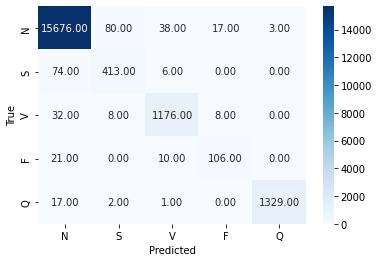

              precision    recall  f1-score   support

           N       0.99      0.99      0.99     15814
           S       0.82      0.84      0.83       493
           V       0.96      0.96      0.96      1224
           F       0.81      0.77      0.79       137
           Q       1.00      0.99      0.99      1349

    accuracy                           0.98     19017
   macro avg       0.91      0.91      0.91     19017
weighted avg       0.98      0.98      0.98     19017



In [ ]:
#create a dataset
test_ds = TensorDataset(torch.from_numpy(X_test_np), torch.from_numpy(y_test_np))
test_dl = DataLoader(test_ds, batch_size=hyper_params['bs'], shuffle=False)

#calculate the sensitivity and specificity for each class using scikit-learn
plot_cm(model, test_dl, class_names)

### Calculate Inception Score

Inception score code adapted from: https://machinelearningmastery.com/how-to-implement-the-inception-score-from-scratch-for-evaluating-generated-images/#:~:text=The%20calculation%20of%20the%20inception%20score%20on%20a%20group%20of,group%20(p(y))

In [ ]:
# calculate the inception score for p(y|x)
def calculate_inception_score(p_yx, eps=1E-16):
 # calculate p(y)
 p_y = np.expand_dims(p_yx.mean(axis=0), 0)
 # kl divergence for each image
 kl_d = p_yx * (np.log(p_yx + eps) - np.log(p_y + eps))
 # sum over classes
 sum_kl_d = np.sum(kl_d, axis=1)
 # average over images
 avg_kl_d = np.mean(sum_kl_d)
 # undo the logs
 is_score = np.exp(avg_kl_d)
 return is_score


In [ ]:
# Check function
# conditional probabilities for high quality images
p_yx = np.asarray([[1.0, 0.0, 0.0], [0.0, 1.0, 0.0], [0.0, 0.0, 1.0]])

calculate_inception_score(p_yx)

2.999999999999999

In [ ]:
# Inception score on real data (train)
softmax= nn.Softmax(dim=-1)
model.eval()
p_yx = []
for batch, _ in train_dl:
    batch = batch.to(device)
    output = model(batch) #out shape: (batch_size, 5)
    output = softmax(output).detach().cpu().numpy()
    if len(p_yx):
      p_yx = np.concatenate((p_yx, output), axis=0)
    else:
      p_yx.append(output)
      p_yx = np.asarray(p_yx)
      p_yx= np.squeeze(p_yx, axis=0)
      print(p_yx.shape)

print(p_yx.shape)
print(p_yx[:10000].shape)
calculate_inception_score(p_yx[:10000])

(1024, 5)
(60852, 5)
(10000, 5)


4.3550835

In [ ]:
py = [np.mean(p_yx[:10000][:, i]) for i in range(5)]
el = p_yx==np.max(p_yx, axis=1).reshape(-1, 1)
p_yx[~el] = 0
p_conditional = []
for col in range(5):
  col_data = p_yx[:10000][:, col]
  p_conditional.append(np.mean(col_data[col_data!=0]))

fig = go.Figure(data=[
    go.Bar(x=list(class_names.values()), y=py, name='p(y)'),
    go.Bar(x=list(class_names.values()), y=p_conditional, name='p(y|x)')
])
# Change the bar mode
fig.update_layout(title="Probability distributions leading to a high Inception score", barmode='group', width=700, height=500)
fig.show()

In [ ]:
# Inception score on real data (train) - imbalanced dataloader
#data loader - we use the random weights sampler to balance the classes
train_dl = DataLoader(train_ds, batch_size=hyper_params['bs'])
# check class distribution
for batch in train_dl:
    print(batch[1].shape)
    unique, counts = np.unique(batch[1], return_counts=True)
    for i in range(len(unique)):
        print(f'{class_names[unique[i]]}: {counts[i]}')
    break



softmax= nn.Softmax(dim=-1)
model.eval()
p_yx = []
for batch, _ in train_dl:
    batch = batch.to(device)
    output = model(batch) #out shape: (batch_size, 5)
    output = softmax(output).detach().cpu().numpy()
    if len(p_yx):
      p_yx = np.concatenate((p_yx, output), axis=0)
    else:
      p_yx.append(output)
      p_yx = np.asarray(p_yx)
      p_yx= np.squeeze(p_yx, axis=0)
      print(p_yx.shape)

print(p_yx.shape)
print(p_yx[:10000].shape)
calculate_inception_score(p_yx[:10000])

torch.Size([1024, 1])
N: 850
S: 23
V: 72
F: 5
Q: 74
(1024, 5)
(60852, 5)
(10000, 5)


1.7858537

In [ ]:
py = [np.mean(p_yx[:10000][:, i]) for i in range(5)]
el = p_yx==np.max(p_yx, axis=1).reshape(-1, 1)
p_yx[~el] = 0
p_conditional = []
for col in range(5):
  col_data = p_yx[:10000][:, col]
  p_conditional.append(np.mean(col_data[col_data!=0]))

fig = go.Figure(data=[
    go.Bar(x=list(class_names.values()), y=py, name='p(y)'),
    go.Bar(x=list(class_names.values()), y=p_conditional, name='p(y|x)')
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

In [ ]:
# Inception score on real data (test)
model.eval()
p_yx = []
for batch, _ in test_dl:
    batch = batch.to(device)
    output = model(batch) #out shape: (batch_size, 5)
    output = softmax(output).detach().cpu().numpy()
    if len(p_yx):
      p_yx = np.concatenate((p_yx, output), axis=0)
    else:
      p_yx.append(output)
      p_yx = np.asarray(p_yx)
      p_yx= np.squeeze(p_yx, axis=0)
      print(p_yx.shape)

print(p_yx.shape)
print(p_yx[:10000].shape)
calculate_inception_score(p_yx[:10000])

(1024, 5)
(19017, 5)
(10000, 5)


1.7365814

In [ ]:
# Inception score on synthetic data
# Generate 10k synthetic samples
nb_samples = 10000
max_sequence_length = 163
sequence_lengths_list= [max_sequence_length]*nb_samples
fake_noise = random_generator(nb_samples, z_dim, sequence_lengths_list, max_sequence_length, device=device)
fake = gen(fake_noise)
fake_sup = sup(fake)
reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
data_synthetic = reconstructed_fake.squeeze().numpy()
data_synthetic.shape

data_synthetic = np.reshape(data_synthetic, (data_synthetic.shape[0], 1, data_synthetic.shape[1]))

# we have to normalize the data
data_synthetic = (data_synthetic - data_synthetic.mean())/data_synthetic.std()

print(f'synthetic mean: {data_synthetic.mean():.4f} \t synthetic std: {data_synthetic.std():.4f}')
data_synthetic.shape

# make predictions using model
#pytorch dataset and dataloader
synthetic_ds = torch.utils.data.TensorDataset(torch.from_numpy(data_synthetic).float())
synthetic_dl = DataLoader(synthetic_ds, batch_size=hyper_params['bs'])

softmax= nn.Softmax(dim=-1)
model.eval()
p_yx = []
for batch in synthetic_dl:
    batch = batch[0].to(device)
    output = model(batch) #out shape: (batch_size, 5)
    output = softmax(output).detach().cpu().numpy()
    if len(p_yx):
      p_yx = np.concatenate((p_yx, output), axis=0)
    else:
      p_yx.append(output)
      p_yx = np.asarray(p_yx)
      p_yx= np.squeeze(p_yx, axis=0)
      # print(p_yx.shape)

print(p_yx.shape)
calculate_inception_score(p_yx)

synthetic mean: -0.0000 	 synthetic std: 1.0000
(10000, 5)


1.1531155

In [ ]:
py = [np.mean(p_yx[:10000][:, i]) for i in range(5)]
el = p_yx==np.max(p_yx, axis=1).reshape(-1, 1)
p_yx[~el] = 0
p_conditional = []
for col in range(5):
  col_data = p_yx[:10000][:, col]
  p_conditional.append(np.mean(col_data[col_data!=0]))

fig = go.Figure(data=[
    go.Bar(x=list(class_names.values()), y=py, name='p(y)'),
    go.Bar(x=list(class_names.values()), y=p_conditional, name='p(y|x)')
])
# Change the bar mode
fig.update_layout(title="Probability distributions leading to a lower Inception score", barmode='group', width=700, height=500)
fig.show()

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:189: RuntimeWarning:

invalid value encountered in true_divide



### Inception score on balanced dataset

In [ ]:
# Inception score on real data (test)
#data loader - we use the random weights sampler to balance the classes

#get weights for each example in the dataset
data_weights = np.zeros(y_test_np.shape[0]) #shape (m, )
for i in range(y_test_np.shape[0]): #for each example we assign the corresponding weight
    data_weights[i] = weights[y_test_np[i, 0]]
print(data_weights[:10])


test_dl = DataLoader(test_ds, batch_size=hyper_params['bs'], sampler=WeightedRandomSampler(weights=data_weights, num_samples= len(y_test_np), replacement=True))
# check class distribution
for batch in test_dl:
    print(batch[1].shape)
    unique, counts = np.unique(batch[1], return_counts=True)
    for i in range(len(unique)):
        print(f'{class_names[unique[i]]}: {counts[i]}')
    break



model.eval()
p_yx = []
for batch, _ in test_dl:
    batch = batch.to(device)
    output = model(batch) #out shape: (batch_size, 5)
    output = softmax(output).detach().cpu().numpy()
    if len(p_yx):
      p_yx = np.concatenate((p_yx, output), axis=0)
    else:
      p_yx.append(output)
      p_yx = np.asarray(p_yx)
      p_yx= np.squeeze(p_yx, axis=0)
      print(p_yx.shape)

print(p_yx.shape)
print(p_yx[:10000].shape)
calculate_inception_score(p_yx[:10000])

[0.06847303 0.00584343 0.00584343 0.00584343 0.00584343 0.00584343
 0.00584343 0.00584343 0.00584343 0.00584343]
torch.Size([1024, 1])
N: 204
S: 171
V: 231
F: 214
Q: 204
(1024, 5)
(19017, 5)
(10000, 5)


4.0644727

In [ ]:
def load_trained_model(checkpoint_path):
  checkpoint = torch.load(checkpoint_path)

  gen = Generator(z_dim, nb_neurons_rnn, nb_neurons_rnn, nb_layers, rnn_type, activation).to(device)
  enc_dec = EncoderDecoder(features_per_timestep, nb_neurons_rnn, nb_neurons_rnn, nb_layers, rnn_type, activation).to(device)
  sup = Supervisor(nb_neurons_rnn, nb_neurons_rnn, nb_neurons_rnn, nb_layers-1, rnn_type, activation).to(device)
  gen.load_state_dict(checkpoint['gen_state_dict'])
  enc_dec.load_state_dict(checkpoint['enc_dec_state_dict'])
  sup.load_state_dict(checkpoint['sup_state_dict'])

  return gen, sup, enc_dec

In [ ]:
# Class 0: 'N'
gen_N, sup_N, enc_dec_N = load_trained_model("timegan_ECG_class_N_iteration_21000.tar")
# Class 1: 'S'
gen_S, sup_S, enc_dec_S = load_trained_model("timegan_ECG_class_S_iteration_16000.tar")
# Class 2: 'V'
gen_V, sup_V, enc_dec_V = load_trained_model("timegan_ECG_class_V_iteration_20000.tar")
# Class 3: 'F'
gen_F, sup_F, enc_dec_F = load_trained_model("timegan_ECG_class_F_iteration_23000.tar")
# Class 4: 'Q'
gen_Q, sup_Q, enc_dec_Q = load_trained_model("timegan_ECG_class_Q_iteration_23000.tar")

gen_list = [(gen_N, sup_N, enc_dec_N, 0), (gen_S, sup_S, enc_dec_S, 1), (gen_V, sup_V, enc_dec_V, 2), (gen_F, sup_F, enc_dec_F, 3), (gen_Q, sup_Q, enc_dec_Q, 4)]

In [ ]:
def make_labelled_dataset(nb_samples, gen_list):
  nb_samples_gen = int(nb_samples / len(gen_list))

  synthetic_dataset= pd.DataFrame()

  for gen, sup, enc_dec, class_name in gen_list:
    max_sequence_length = 163
    sequence_lengths_list= [max_sequence_length]*nb_samples_gen
    fake_noise = random_generator(nb_samples_gen, z_dim, sequence_lengths_list, max_sequence_length, device=device)
    fake = gen(fake_noise)
    fake_sup = sup(fake)
    reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
    data_synthetic = reconstructed_fake.squeeze().numpy()
    data_synthetic_train = pd.DataFrame(data_synthetic)
    data_synthetic_train["label"]=class_name
    synthetic_dataset= pd.concat([synthetic_dataset, data_synthetic_train])

  return synthetic_dataset

In [ ]:
synthetic_dataset= make_labelled_dataset(10000, gen_list)
synthetic_dataset

,0,1,2,3,4,5,6,7,8,9,...,154,155,156,157,158,159,160,161,162,label
0,0.632359,0.955495,0.635910,0.312110,0.191409,0.194303,0.204868,0.157842,0.135355,0.144055,...,0.000138,0.000156,0.000178,0.000150,0.000157,0.000177,0.000145,0.000146,0.000142,0
1,0.543901,0.799957,0.771579,0.591082,0.465128,0.448719,0.458650,0.359275,0.307139,0.329047,...,0.000153,0.000150,0.000159,0.000418,0.000140,0.000182,0.000182,0.000171,0.000154,0
2,0.705764,0.986177,0.629746,0.319103,0.217683,0.163089,0.134771,0.133414,0.129182,0.121508,...,0.000143,0.000195,0.000159,0.000155,0.000150,0.000145,0.000148,0.000149,0.000153,0
3,0.699366,0.985012,0.631191,0.336449,0.205120,0.201603,0.186638,0.178545,0.177320,0.170275,...,0.000157,0.000144,0.000141,0.000139,0.000142,0.000153,0.000194,0.000150,0.000152,0
4,0.500283,0.714246,0.898817,0.864792,0.774438,0.741304,0.731353,0.675114,0.573589,0.502011,...,0.000172,0.000158,0.000172,0.000154,0.000167,0.000157,0.000177,0.000170,0.000223,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.692832,0.957936,0.793413,0.663602,0.609881,0.550096,0.460652,0.387228,0.327934,0.256765,...,0.000232,0.000628,0.000405,0.000273,0.000792,0.000269,0.000481,0.000335,0.000275,4
1996,0.673862,0.944252,0.770382,0.638875,0.577662,0.516019,0.432160,0.368572,0.316589,0.266087,...,0.000230,0.000286,0.000233,0.000217,0.000206,0.000197,0.000193,0.000190,0.000188,4
1997,0.586052,0.701584,0.364799,0.381417,0.476007,0.411489,0.335573,0.246976,0.178294,0.087792,...,0.000185,0.000184,0.000183,0.000182,0.000181,0.000180,0.000180,0.000179,0.000179,4
1998,0.627159,0.890328,0.693931,0.548923,0.466539,0.460347,0.505471,0.500227,0.351758,0.220919,...,0.000191,0.000188,0.000187,0.000185,0.000184,0.000183,0.000182,0.000182,0.000181,4


In [ ]:
# Inception score on synthetic data
# Generate 10k synthetic samples
synthetic_dataset= make_labelled_dataset(10000, gen_list)

data_synthetic = np.reshape(synthetic_dataset.iloc[:, :-1].values, (synthetic_dataset.iloc[:, :-1].shape[0], 1, synthetic_dataset.iloc[:, :-1].shape[1]))
# we have to normalize the data
data_synthetic = (data_synthetic - data_synthetic.mean())/data_synthetic.std()
# make predictions using model
#pytorch dataset and dataloader
synthetic_ds = torch.utils.data.TensorDataset(torch.from_numpy(data_synthetic).float())
synthetic_dl = DataLoader(synthetic_ds, batch_size=hyper_params['bs'])

softmax= nn.Softmax(dim=-1)
model.eval()
p_yx = []
for batch in synthetic_dl:
    batch = batch[0].to(device)
    output = model(batch) #out shape: (batch_size, 5)
    output = softmax(output).detach().cpu().numpy()
    if len(p_yx):
      p_yx = np.concatenate((p_yx, output), axis=0)
    else:
      p_yx.append(output)
      p_yx = np.asarray(p_yx)
      p_yx= np.squeeze(p_yx, axis=0)
      # print(p_yx.shape)

print(p_yx.shape)
calculate_inception_score(p_yx)

(10000, 5)


2.693878

In [ ]:
py = [np.mean(p_yx[:10000][:, i]) for i in range(5)]
el = p_yx==np.max(p_yx, axis=1).reshape(-1, 1)
p_yx[~el] = 0
p_conditional = []
for col in range(5):
  col_data = p_yx[:10000][:, col]
  p_conditional.append(np.mean(col_data[col_data!=0]))

fig = go.Figure(data=[
    go.Bar(x=list(class_names.values()), y=py, name='p(y)'),
    go.Bar(x=list(class_names.values()), y=p_conditional, name='p(y|x)')
])
# Change the bar mode
fig.update_layout(barmode='group', width=800, height=500)
fig.show()

## Cross-classification

### Load pre-trained TimeGAN on each class of data

In [ ]:
def load_trained_model(checkpoint_path):
  checkpoint = torch.load(checkpoint_path, map_location=device)

  gen = Generator(z_dim, nb_neurons_rnn, nb_neurons_rnn, nb_layers, rnn_type, activation).to(device)
  enc_dec = EncoderDecoder(features_per_timestep, nb_neurons_rnn, nb_neurons_rnn, nb_layers, rnn_type, activation).to(device)
  sup = Supervisor(nb_neurons_rnn, nb_neurons_rnn, nb_neurons_rnn, nb_layers-1, rnn_type, activation).to(device)
  gen.load_state_dict(checkpoint['gen_state_dict'])
  enc_dec.load_state_dict(checkpoint['enc_dec_state_dict'])
  sup.load_state_dict(checkpoint['sup_state_dict'])

  return gen, sup, enc_dec

In [ ]:
# Class 0: 'N'
gen_N, sup_N, enc_dec_N = load_trained_model("timegan_ECG_class_N_iteration_21000.tar")
# Class 1: 'S'
gen_S, sup_S, enc_dec_S = load_trained_model("timegan_ECG_class_S_iteration_16000.tar")
# Class 2: 'V'
gen_V, sup_V, enc_dec_V = load_trained_model("timegan_ECG_class_V_iteration_20000.tar")
# Class 3: 'F'
gen_F, sup_F, enc_dec_F = load_trained_model("timegan_ECG_class_F_iteration_23000.tar")
# Class 4: 'Q'
gen_Q, sup_Q, enc_dec_Q = load_trained_model("timegan_ECG_class_Q_iteration_23000.tar")

gen_list = [(gen_N, sup_N, enc_dec_N, 0), (gen_S, sup_S, enc_dec_S, 1), (gen_V, sup_V, enc_dec_V, 2), (gen_F, sup_F, enc_dec_F, 3), (gen_Q, sup_Q, enc_dec_Q, 4)]

In [ ]:
#make a dictionary to map the target indices to class names
class_names = {0: 'N', 1: 'S', 2: 'V', 3: 'F', 4: 'Q'}
class_nbs = {'N':0 , 'S':1 ,'V': 2 , 'F':3 , 'Q':4 }

def name_to_nb(df):
  df['Class'] = df['Class'].map(lambda c: class_nbs[c])
  return df

### Create labelled synthetic data

In [ ]:
def make_labelled_dataset(nb_samples, gen_list):
  nb_samples_gen = int(nb_samples / len(gen_list))

  synthetic_dataset= pd.DataFrame()

  for gen, sup, enc_dec, class_name in gen_list:
    max_sequence_length = 163
    sequence_lengths_list= [max_sequence_length]*nb_samples_gen
    fake_noise = random_generator(nb_samples_gen, z_dim, sequence_lengths_list, max_sequence_length, device=device)
    fake = gen(fake_noise)
    fake_sup = sup(fake)
    reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
    data_synthetic = reconstructed_fake.squeeze().numpy()
    data_synthetic_train = pd.DataFrame(data_synthetic)
    data_synthetic_train["label"]=class_name
    synthetic_dataset= pd.concat([synthetic_dataset, data_synthetic_train])

  return synthetic_dataset

def make_labelled_dataset_test(dict_nb_samples, nb_samples, gen_list):

  synthetic_dataset= pd.DataFrame()

  for gen, sup, enc_dec, class_name in gen_list:
    max_sequence_length = 163
    sequence_lengths_list= [max_sequence_length]*nb_samples
    fake_noise = random_generator(dict_nb_samples[class_name], z_dim, sequence_lengths_list, max_sequence_length, device=device)
    fake = gen(fake_noise)
    fake_sup = sup(fake)
    reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
    data_synthetic = reconstructed_fake.squeeze().numpy()
    data_synthetic_train = pd.DataFrame(data_synthetic)
    data_synthetic_train["label"]=class_name
    synthetic_dataset= pd.concat([synthetic_dataset, data_synthetic_train])

  return synthetic_dataset

In [ ]:
synthetic_dataset= make_labelled_dataset(1000, gen_list)
display(synthetic_dataset.sample(5))
print()
synthetic_dataset['label'].value_counts().to_frame()

,0,1,2,3,4,5,6,7,8,9,...,154,155,156,157,158,159,160,161,162,label
131,0.799966,0.664189,0.714808,0.618639,0.106482,0.102442,0.093298,0.195003,0.190803,0.340035,...,0.000119,0.000119,0.000119,0.000119,0.000119,0.000119,0.000119,0.000119,0.000119,1
28,0.558084,0.725962,0.889530,0.771659,0.687733,0.664942,0.494212,0.326243,0.234282,0.189584,...,0.000140,0.000145,0.000146,0.000154,0.000144,0.000141,0.000144,0.000144,0.000146,0
141,0.526675,0.924852,0.464646,0.042529,0.091473,0.119457,0.104293,0.172606,0.194615,0.231680,...,0.000119,0.000119,0.000119,0.000119,0.000118,0.000118,0.000118,0.000118,0.000118,1
104,0.542082,0.675287,0.948042,0.880272,0.696188,0.596347,0.407193,0.265280,0.368189,0.536524,...,0.000142,0.000141,0.000143,0.000141,0.000138,0.000138,0.000138,0.000136,0.000132,0
162,0.565309,0.640931,0.671094,0.494790,0.293578,0.359328,0.379466,0.409872,0.398698,0.412805,...,0.000119,0.000119,0.000118,0.000118,0.000118,0.000118,0.000118,0.000118,0.000118,1


,label
0,200
1,200
2,200
3,200
4,200


### tSNE visualization classes

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.002s...
[t-SNE] Computed neighbors for 1000 samples in 0.246s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.733942
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.263336
[t-SNE] KL divergence after 300 iterations: 0.547532


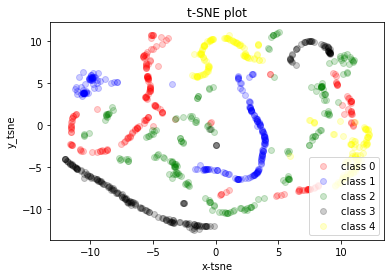

In [ ]:
# tSNE visualization of synthetic samples

class_colors = {0: 'red', 1: 'blue', 2: 'green', 3: 'black', 4: 'yellow'}

# TSNE anlaysis
tsne = TSNE(n_components = 2, verbose = 1, perplexity = 40, n_iter = 300)
tsne_results = tsne.fit_transform(synthetic_dataset.iloc[:, :-1].values)

# Plotting
f, ax = plt.subplots(1)
start= 0
for i in range(5):
  plt.scatter(tsne_results[start:200+start,0], tsne_results[start:200+start,1], c = class_colors[i], alpha = 0.2, label = f"class {i}")
  start = 200+start

ax.legend()

plt.title('t-SNE plot')
plt.xlabel('x-tsne')
plt.ylabel('y_tsne')
plt.show()

In [ ]:
file_directory="/content/drive/MyDrive/Colab Notebooks/"
real_dataset = load_ecg_data(file_directory+"all_records_train.csv", np=False, drop_class=False).reset_index(drop=True)
name_to_nb(real_dataset)
# real_dataset['Class'].value_counts().to_frame()

stratified_sample = real_dataset.groupby('Class').apply(
    lambda x: x.sample(200)
)

# stratified_sample.head()
stratified_sample = stratified_sample.droplevel(0)
real_dataset = stratified_sample
real_dataset['Class'].value_counts().to_frame()

,Class
0,200
1,200
2,200
3,200
4,200


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.002s...
[t-SNE] Computed neighbors for 1000 samples in 0.044s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.722839
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.632683
[t-SNE] KL divergence after 300 iterations: 0.798634


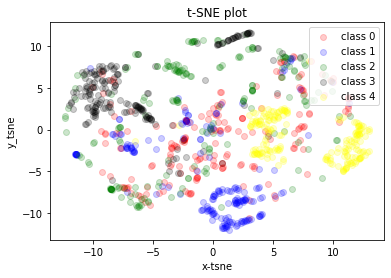

In [ ]:
# tSNE visualization of real samples

class_colors = {0: 'red', 1: 'blue', 2: 'green', 3: 'black', 4: 'yellow'}

# TSNE anlaysis
tsne = TSNE(n_components = 2, verbose = 1, perplexity = 40, n_iter = 300)
tsne_results = tsne.fit_transform(real_dataset.iloc[:, :-1].values)

# Plotting
f, ax = plt.subplots(1)
start= 0
for i in range(5):
  plt.scatter(tsne_results[start:200+start,0], tsne_results[start:200+start,1], c = class_colors[i], alpha = 0.2, label = f"class {i}")
  start = 200+start

ax.legend()

plt.title('t-SNE plot')
plt.xlabel('x-tsne')
plt.ylabel('y_tsne')
plt.show()

### PCA visualization classes

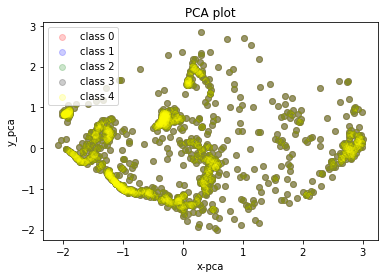

In [ ]:
# PCA fitted on synthetic data
# Parameters
# PCA Analysis
pca = PCA(n_components = 2)
pca.fit(synthetic_dataset.iloc[:, :-1].values)
pca_results = pca.transform(synthetic_dataset.iloc[:, :-1].values)

# Plotting
f, ax = plt.subplots(1)

start= 0
for i in range(5):
  plt.scatter(pca_results[:,0], pca_results[:,1], c = class_colors[i], alpha = 0.2, label = f"class {i}")
  start = 200+start

ax.legend()

plt.title('PCA plot')
plt.xlabel('x-pca')
plt.ylabel('y_pca')
plt.show()

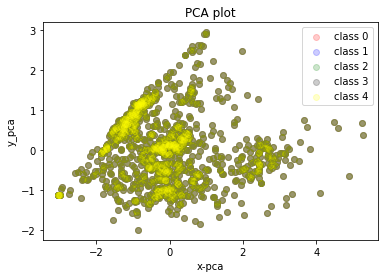

In [ ]:
# PCA fitted on real data
# Parameters
# PCA Analysis
pca = PCA(n_components = 2)
pca.fit(real_dataset.iloc[:, :-1].values)
pca_results = pca.transform(real_dataset.iloc[:, :-1].values)

# Plotting
f, ax = plt.subplots(1)

start= 0
for i in range(5):
  plt.scatter(pca_results[:,0], pca_results[:,1], c = class_colors[i], alpha = 0.2, label = f"class {i}")
  start = 200+start

ax.legend()

plt.title('PCA plot')
plt.xlabel('x-pca')
plt.ylabel('y_pca')
plt.show()

### Create classifier

In [ ]:
def preprocess_data(data, batch_size, train=True, real_data=True):

    y_df = data.iloc[:, -1]
    y_df = y_df.astype('int')
    X_df = data.iloc[:, :-1]
    X_df = X_df.astype('float')

    X_np = X_df.to_numpy()
    X_np = X_np.reshape(-1, 1, 163)
    y_np = y_df.to_numpy()
    y_np = y_np.reshape(-1, 1)

    X_mean = X_np.mean()
    X_std = X_np.std()
    X_max = X_np.max()
    X_min = X_np.min()
    print(f'mean before normalization: {X_mean}')
    print(f'std: {X_std}')
    print(f'max: {X_max}')

    #we need to subtract the mean from the data
    X_norm = X_np - X_mean
    #then multiply by 1/std to make the std = 1
    X_norm *= 1/X_std

    print(X_norm.shape)
    print(f'new mean is {X_norm.mean()}')
    print(f'new std is {X_norm.std()}')
    y_np = y_np.astype('int')


    if train:
      #shuffle the data and split into train and validation sets
      X_train, X_val, y_train, y_val = train_test_split(X_norm, y_np, test_size=0.2, shuffle=True)

      print(f'Frequency of each class in the train set')
      y_train_df = pd.DataFrame(y_train)
      display(y_train_df.value_counts(normalize=True).to_frame())
      display(y_train_df.value_counts().to_frame())
      print(f'Frequency of each class in the validation set')
      y_val_df = pd.DataFrame(y_val)
      display(y_val_df.value_counts(normalize=True).to_frame())
      y_val_df.value_counts().to_frame()

      #pytorch dataset and dataloader
      train_ds = torch.utils.data.TensorDataset(torch.from_numpy(X_train).float(), torch.from_numpy(y_train).long())
      val_ds = torch.utils.data.TensorDataset(torch.from_numpy(X_val).float(), torch.from_numpy(y_val).long())
      print(len(train_ds), len(val_ds))

      if real_data:
        #the class distribution is not uniform so we have to define weights for each class
        class_dist = np.unique(y_train, return_counts=True)[1] #index 1 returns the counts
        class_dist = class_dist/np.sum(class_dist) #normalize to get 0-1 values
        # normalize the weights
        weights = 1/class_dist #invert to compensate for class distribution imbalance
        weights = weights/weights.sum() #normalize to get values 0-1

        #get weights for each example in the dataset
        data_weights = np.zeros(y_train.shape[0]) #shape (m, )
        for i in range(y_train.shape[0]): #for each example we assign the corresponding weight
            data_weights[i] = weights[y_train[i, 0]]
        #data loader - we use the random weights sampler to balance the classes
        train_dl = DataLoader(train_ds, batch_size=batch_size, sampler=WeightedRandomSampler(weights=data_weights, num_samples= len(y_train), replacement=True))
        # val_dl = DataLoader(val_ds, batch_size=batch_size, shuffle=True)
        data_weights = np.zeros(y_val.shape[0]) #shape (m, )
        for i in range(y_val.shape[0]): #for each example we assign the corresponding weight
            data_weights[i] = weights[y_val[i, 0]]
        val_dl = DataLoader(val_ds, batch_size=batch_size, sampler=WeightedRandomSampler(weights=data_weights, num_samples= len(y_val), replacement=True))
      else:
        train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
        val_dl = DataLoader(val_ds, batch_size=batch_size, shuffle=True)

      #get the class distribution in dataloader
      print("class distribution in 1 batch using weighted sampler:")
      for batch in train_dl:
          print(batch[1].shape)
          unique, counts = np.unique(batch[1], return_counts=True)
          for i in range(len(unique)):
              print(f'{class_names[unique[i]]}: {counts[i]}')
          break

      return train_dl, val_dl

    else:

      print(f'Frequency of each class in the test set')
      y_test_df = pd.DataFrame(y_np)
      display(y_test_df.value_counts(normalize=True).to_frame())
      display(y_test_df.value_counts().to_frame())

      if real_data:
        #the class distribution is not uniform so we have to define weights for each class
        class_dist = np.unique(y_np, return_counts=True)[1] #index 1 returns the counts
        class_dist = class_dist/np.sum(class_dist) #normalize to get 0-1 values
        # normalize the weights
        weights = 1/class_dist #invert to compensate for class distribution imbalance
        weights = weights/weights.sum() #normalize to get values 0-1

        #get weights for each example in the dataset
        data_weights = np.zeros(y_np.shape[0]) #shape (m, )
        for i in range(y_np.shape[0]): #for each example we assign the corresponding weight
            data_weights[i] = weights[y_np[i, 0]]
        #data loader - we use the random weights sampler to balance the classes
        test_ds = torch.utils.data.TensorDataset(torch.from_numpy(X_norm).float(), torch.from_numpy(y_np).long())
        test_dl = DataLoader(test_ds, batch_size=batch_size, sampler=WeightedRandomSampler(weights=data_weights, num_samples= len(y_np), replacement=True))
      else:
        test_ds = torch.utils.data.TensorDataset(torch.from_numpy(X_norm).float(), torch.from_numpy(y_np).long())
        print(len(test_ds))
        test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=True)


      #get the class distribution in dataloader
      print("class distribution in 1 batch:")
      for batch in test_dl:
          print(batch[1].shape)
          unique, counts = np.unique(batch[1], return_counts=True)
          for i in range(len(unique)):
              print(f'{class_names[unique[i]]}: {counts[i]}')
          break

      return test_dl


In [ ]:
#make some convolutional blocks to use in the model
def nin_block(in_channels, out_channels, kernel_size, padding, strides):
    return nn.Sequential(
        nn.Conv1d(in_channels, out_channels, kernel_size, strides, padding),
        nn.BatchNorm1d(out_channels),
        nn.GELU(),
        nn.Conv1d(out_channels, out_channels, kernel_size=1), nn.GELU(),
        nn.Conv1d(out_channels, out_channels, kernel_size=1), nn.GELU()
    )


def get_model():
    return nn.Sequential( #input shape: (batch_size, 1, 187)
        nin_block(1, 48, kernel_size=11, strides=4, padding=0), #output shape: (batch_size, 48, 44)
        nn.MaxPool1d(3, stride=2), #output shape: (batch_size, 48, 21)
        nin_block(48, 128, kernel_size=5, strides=1, padding=2), #output shape: (batch_size, 128, 21)
        nn.MaxPool1d(3, stride=2), #output shape: (batch_size, 128, 10)
        nin_block(128, 256, kernel_size=3, strides=1, padding=1), #output shape: (batch_size, 256, 10)
        nn.MaxPool1d(3, stride=2), #output shape: (batch_size, 256, 4)
        nn.Dropout(0.4),
        #last layers for classification of 5 classes
        nin_block(256, 5, kernel_size=3, strides=1, padding=1), #output shape: (batch_size, 5, 4)
        nn.AdaptiveAvgPool1d(1), #output shape: (batch_size, 5, 1)
        nn.Flatten() #output shape: (batch_size, 5)
    )


def train(model, criterion, optimizer, train_dl, val_dl, epochs, trained_on="real", lr_scheduler: StepLR=None):
    """trains the model for the given number of epochs

    Args:
        model (nn.Module): nn model
        criterion (nn.CELoss): loss function
        optimizer (torch.optim): optimizer
        train_dl (Dataloader): training dataloader
        val_dl (Dataloader): validation dataloader
        epochs (int): number of epochs to train for
        lr_scheduler (StepLR): learning rate scheduler to adjust lr during training
    Returns:
        list of training losses and validation losses, best model parameters, best accuracy
    """
    train_losses = []
    val_losses = []
    best_model_params = deepcopy(model.state_dict())
    best_accuracy = 0.0
    for epoch in tqdm(range(epochs)):
        # print(f'Epoch {epoch+1}/{epochs}')
        # print('-'*10)
        train_loss = 0
        val_loss = 0
        model.train() #set the model to training mode
        for x, y in train_dl: #x: (batch_size, 1, 187), y: (batch_size, 1)
            x = x.to(device)
            y = y.to(device)
            optimizer.zero_grad()
            output = model(x) #the output shape is (batch_size, 5) so it's a distribution over the 5 classes
            loss = criterion(output, y.squeeze())
            loss.backward()
            optimizer.step()
            train_loss += loss.item()*x.size(0)
        train_loss = train_loss/len(train_dl.dataset)
        train_losses.append(train_loss)
        lr_scheduler.step() #update the learning rate every n epochs
        model.eval() #set the model to evaluation mode
        corrects = 0 #in order to calculate accuracy we store the number of correct predictions
        for x, y in val_dl:
            x = x.to(device)
            y = y.to(device)
            output = model(x) #out shape: (batch_size, 5)
            loss = criterion(output, y.squeeze())
            val_loss += loss.item()*x.size(0)
            #calculate the number of correct predictions
            corrects += torch.sum(torch.argmax(output, dim=1) == y.squeeze()).item()
        val_loss = val_loss/len(val_dl.dataset)
        accuracy = corrects/len(val_dl.dataset)
        val_losses.append(val_loss)
        # print(f'Train Loss: {train_loss:.4f} \t Val Loss: {val_loss:.4f} \t Val Accuracy: {accuracy:.4f}')
        #if the model performs better on the validation set, save the model parameters
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_model_params = deepcopy(model.state_dict())
    print('Finished Training and the best accuracy is: {:.4f}'.format(best_accuracy))

    #load the best model parameters
    model.load_state_dict(best_model_params)
    #save the model to a file
    torch.save(model.state_dict(), f'best_crossclassification_{trained_on}_model{best_accuracy:.2f}.pt')

    return train_losses, val_losses, best_accuracy


def create_train_model(dataset, trained_on):

  hyper_params = {'bs': 1024,
                'lr': 1e-3,
                'lr_decay': 0.3,
                'epochs':200,
                }

  real_data= True if trained_on=="real" else False
  train_dl, val_dl = preprocess_data(dataset, hyper_params['bs'], train=True, real_data=real_data)

  model = get_model()
  model = model.to(device)
  print(f'Model size: {sum(p.numel() for p in model.parameters() if p.requires_grad)*4/(1024**2)} MB')
  #number of trainable parameters
  print(f'Number of trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad)}')

  #loss function
  criterion = nn.CrossEntropyLoss(weight=torch.tensor([1, 1.1, 2.5, 3, 1], dtype=torch.float, device=device)) #CE loss automatically uses indices as targets
  #optimizer
  optimizer = torch.optim.Adam(model.parameters(), lr=hyper_params['lr'])
  #lr_scheduler
  lr_scheduler = StepLR(optimizer, step_size=10, gamma=hyper_params['lr_decay'], verbose=False)

  train_losses, val_losses, best_accuracy = train(model, criterion, optimizer, train_dl, val_dl, hyper_params['epochs'], trained_on, lr_scheduler)

  df_losses = pd.DataFrame(list(zip(train_losses, val_losses)),
                        columns =['Train', 'Validation' ])

  fig = go.Figure()
  for col in df_losses.columns:
    fig.add_trace(go.Scatter(x=df_losses.index, y=df_losses[col],
                      mode='lines',
                      name=col))

  # Edit the layout
  fig.update_layout(title='Classifier Losses',
                  xaxis_title='Epoch',
                  yaxis_title='Mean Loss per sample')
  fig.show()

  plot_cm(model, val_dl, {0: 'N', 1: 'S', 2: 'V', 3: 'F', 4: 'Q'})

  calculate_accuracy(model, val_dl, test=False)

  return model

#confusion matrix function
def plot_cm(model, dl, categories, normalize=None):
    #plot the confusion matrix
    model.eval()
    y_pred = []
    y_true = []
    for x, y in dl:
        x = x.to(device)
        y = y.to(device)
        output = model(x) #out shape: (batch_size, 5)
        y_pred.extend(torch.argmax(output, dim=1).cpu().numpy())
        y_true.extend(y.cpu().numpy())
    cm = confusion_matrix(y_true, y_pred, normalize=normalize)
    sns.heatmap(cm, annot=True, fmt= '.2f', cmap='Blues', xticklabels=categories.values(), yticklabels=categories.values())
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()
    print()
    print(classification_report(y_true, y_pred, target_names=class_names.values()))


def calculate_accuracy(model, dl, test=True):

  model.eval() #set the model to evaluation mode
  corrects = 0 #in order to calculate accuracy we store the number of correct predictions
  for x, y in dl:
      x = x.to(device)
      y = y.to(device)
      output = model(x) #out shape: (batch_size, 5)
      #calculate the number of correct predictions
      corrects += torch.sum(torch.argmax(output, dim=1) == y.squeeze()).item()
  accuracy = corrects/len(dl.dataset)

  if test:
    print('Accuracy on test data is: {:.4f}'.format(accuracy))
  else:
    print('Accuracy is: {:.4f}'.format(accuracy))

  return accuracy

### Train on real

In [ ]:
# Train on real
file_directory="/content/drive/MyDrive/Colab Notebooks/"
real_dataset = load_ecg_data(file_directory+"all_records_train.csv", np=False, drop_class=False).sample(40000).reset_index(drop=True)
name_to_nb(real_dataset)
model = create_train_model(real_dataset, trained_on="real")

In [ ]:
model = get_model()
model = model.to(device)
print(f'Model size: {sum(p.numel() for p in model.parameters() if p.requires_grad)*4/(1024**2)} MB')
#number of trainable parameters
print(f'Number of trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad)}')

best_checkpoint_path = "best_crossclassification_real_model0.93.pt"
model.load_state_dict(torch.load(best_checkpoint_path, map_location=device))


Model size: 1.1599540710449219 MB
Number of trainable parameters: 304075


<All keys matched successfully>

mean before normalization: 0.21468773211015962
std: 0.22351622352553785
max: 1.062297041033849
(40000, 1, 163)
new mean is -3.8388488025753044e-16
new std is 0.9999999999999998
Frequency of each class in the train set


,0
0,
0,0.830500
4,0.072813
2,0.063625
1,0.025719
3,0.007344


,0
0,
0,26576
4,2330
2,2036
1,823
3,235


Frequency of each class in the validation set


,0
0,
0,0.834625
4,0.070000
2,0.063500
1,0.026125
3,0.005750


32000 8000
class distribution in 1 batch using weighted sampler:
torch.Size([1024, 1])
N: 190
S: 195
V: 226
F: 194
Q: 219


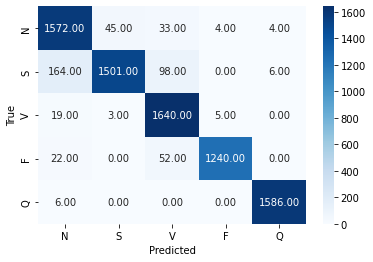


              precision    recall  f1-score   support

           N       0.88      0.95      0.91      1658
           S       0.97      0.85      0.90      1769
           V       0.90      0.98      0.94      1667
           F       0.99      0.94      0.97      1314
           Q       0.99      1.00      0.99      1592

    accuracy                           0.94      8000
   macro avg       0.95      0.94      0.94      8000
weighted avg       0.95      0.94      0.94      8000



In [ ]:
_, val_dl = preprocess_data(real_dataset, 1024, train=True, real_data=True)
plot_cm(model, val_dl, class_names)

mean before normalization: 0.21506294368330126
std: 0.22390400133186847
max: 1.0503303847550272
(10000, 1, 163)
new mean is 1.4060899683851406e-16
new std is 1.0
Frequency of each class in the test set


,0
0,
0,0.8274
4,0.0737
2,0.0662
1,0.0256
3,0.0071


,0
0,
0,8274
4,737
2,662
1,256
3,71


class distribution in 1 batch:
torch.Size([1024, 1])
N: 190
S: 200
V: 198
F: 217
Q: 219
Accuracy on test data is: 0.9129



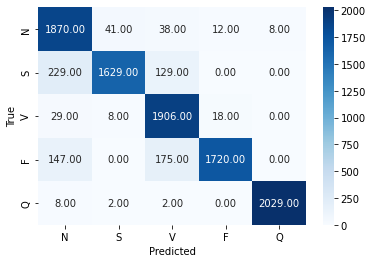


              precision    recall  f1-score   support

           N       0.82      0.95      0.88      1969
           S       0.97      0.82      0.89      1987
           V       0.85      0.97      0.91      1961
           F       0.98      0.84      0.91      2042
           Q       1.00      0.99      1.00      2041

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



In [ ]:
# Test on real
real_dataset_test= load_ecg_data(file_directory+"all_records_test.csv", np=False, drop_class=False).sample(10000, random_state=42).reset_index(drop=True)
name_to_nb(real_dataset_test)
test_dl = preprocess_data(real_dataset_test, 1024, train=False)

accuracy_real = calculate_accuracy(model, test_dl)
print()
plot_cm(model, test_dl, class_names)

In [ ]:
real_dataset_test['Class'].value_counts().to_dict()

{0: 8274, 4: 737, 2: 662, 1: 256, 3: 71}

mean before normalization: 0.23247359555664343
std: 0.22067073750151434
max: 0.9949252605438232
(10000, 1, 163)
new mean is -6.918855399990375e-17
new std is 0.9999999999999998
Frequency of each class in the test set


,0
0,
0,0.2
1,0.2
2,0.2
3,0.2
4,0.2


,0
0,
0,2000
1,2000
2,2000
3,2000
4,2000


10000
class distribution in 1 batch:
torch.Size([1024, 1])
N: 194
S: 201
V: 219
F: 205
Q: 205
Accuracy on test data is: 0.5317



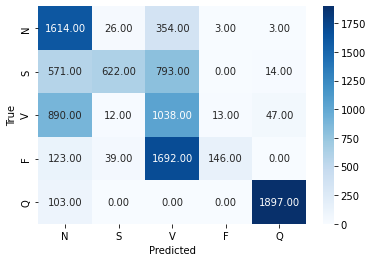


              precision    recall  f1-score   support

           N       0.49      0.81      0.61      2000
           S       0.89      0.31      0.46      2000
           V       0.27      0.52      0.35      2000
           F       0.90      0.07      0.14      2000
           Q       0.97      0.95      0.96      2000

    accuracy                           0.53     10000
   macro avg       0.70      0.53      0.50     10000
weighted avg       0.70      0.53      0.50     10000



In [ ]:
# Test on synthetic

synthetic_dataset_test= make_labelled_dataset(10000, gen_list)
test_dl = preprocess_data(synthetic_dataset_test, 1024, train=False, real_data=False)

accuracy_synthetic = calculate_accuracy(model, test_dl)

print()
plot_cm(model, test_dl, class_names)

del synthetic_dataset_test

mean before normalization: 0.6112448314002483
std: 0.19863308065972574
max: 0.9947698712348938
(10000, 1, 163)
new mean is -1.2219591391918484e-16
new std is 1.0000000000000002
Frequency of each class in the test set


,0
0,
0,0.8318
4,0.0704
2,0.0636
1,0.0271
3,0.0071


,0
0,
0,8318
4,704
2,636
1,271
3,71


class distribution in 1 batch:
torch.Size([1024, 1])
N: 213
S: 193
V: 201
F: 204
Q: 213
Accuracy on test data is: 0.1926



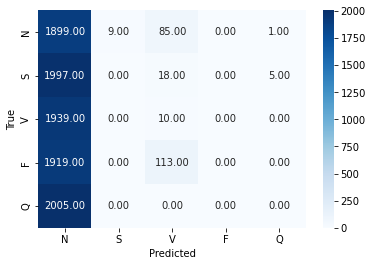


              precision    recall  f1-score   support

           N       0.19      0.95      0.32      1994
           S       0.00      0.00      0.00      2020
           V       0.04      0.01      0.01      1949
           F       0.00      0.00      0.00      2032
           Q       0.00      0.00      0.00      2005

    accuracy                           0.19     10000
   macro avg       0.05      0.19      0.07     10000
weighted avg       0.05      0.19      0.07     10000



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
# # Test on synthetic
# dict_nb_samples= real_dataset_test['Class'].value_counts().to_dict()
# synthetic_dataset_test= make_labelled_dataset_test(dict_nb_samples, 10000, gen_list)
# test_dl = preprocess_data(synthetic_dataset_test, 1024, train=False)

# accuracy_synthetic = calculate_accuracy(model, test_dl)

# print()
# plot_cm(model, test_dl, class_names)

# del synthetic_dataset_test

In [ ]:
print(f"Cross-classification metric = {accuracy_synthetic/accuracy_real:.3f}")

Cross-classification metric = 0.582


### Train on synthetic

mean before normalization: 0.2327218166044195
std: 0.22099132915975242
max: 0.9952097535133362
(40000, 1, 163)
new mean is -7.433584763417077e-16
new std is 1.000000000000001
Frequency of each class in the train set


,0
0,
3,0.200656
4,0.200344
0,0.200094
2,0.199687
1,0.199219


,0
0,
3,6421
4,6411
0,6403
2,6390
1,6375


Frequency of each class in the validation set


,0
0,
1,0.203125
2,0.201250
0,0.199625
4,0.198625
3,0.197375


32000 8000
class distribution in 1 batch using weighted sampler:
torch.Size([1024, 1])
N: 199
S: 187
V: 219
F: 218
Q: 201
Model size: 1.1599540710449219 MB
Number of trainable parameters: 304075


  0%|          | 0/200 [00:00<?, ?it/s]

Finished Training and the best accuracy is: 1.0000


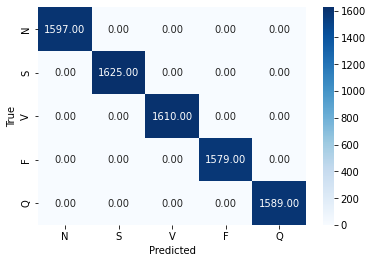


              precision    recall  f1-score   support

           N       1.00      1.00      1.00      1597
           S       1.00      1.00      1.00      1625
           V       1.00      1.00      1.00      1610
           F       1.00      1.00      1.00      1579
           Q       1.00      1.00      1.00      1589

    accuracy                           1.00      8000
   macro avg       1.00      1.00      1.00      8000
weighted avg       1.00      1.00      1.00      8000

Accuracy is: 1.0000


In [ ]:
# Train on synthetic
synthetic_dataset= make_labelled_dataset(40000, gen_list)
model = create_train_model(synthetic_dataset, trained_on="synthetic")
del synthetic_dataset


mean before normalization: 0.21506294368330126
std: 0.22390400133186847
max: 1.0503303847550272
(10000, 1, 163)
new mean is 1.4060899683851406e-16
new std is 1.0
Frequency of each class in the test set


,0
0,
0,0.8274
4,0.0737
2,0.0662
1,0.0256
3,0.0071


,0
0,
0,8274
4,737
2,662
1,256
3,71


class distribution in 1 batch:
torch.Size([1024, 1])
N: 198
S: 207
V: 226
F: 210
Q: 183
Accuracy on test data is: 0.5033



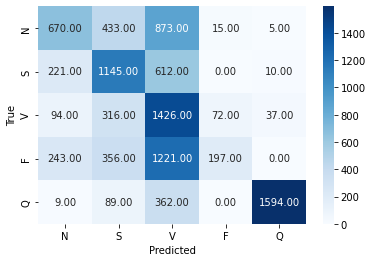


              precision    recall  f1-score   support

           N       0.54      0.34      0.41      1996
           S       0.49      0.58      0.53      1988
           V       0.32      0.73      0.44      1945
           F       0.69      0.10      0.17      2017
           Q       0.97      0.78      0.86      2054

    accuracy                           0.50     10000
   macro avg       0.60      0.50      0.48     10000
weighted avg       0.61      0.50      0.49     10000



In [ ]:
# Test on real
file_directory="/content/drive/MyDrive/Colab Notebooks/"
real_dataset_test= load_ecg_data(file_directory+"all_records_test.csv", np=False, drop_class=False).sample(10000, random_state=42).reset_index(drop=True)
name_to_nb(real_dataset_test)
test_dl = preprocess_data(real_dataset_test, 1024, train=False)

accuracy_real = calculate_accuracy(model, test_dl)
print()
plot_cm(model, test_dl, class_names)

mean before normalization: 0.23322036248142325
std: 0.22027094191779564
max: 0.9952763319015503
(10000, 1, 163)
new mean is -4.89341627886416e-16
new std is 1.0
Frequency of each class in the test set


,0
0,
0,0.2
1,0.2
2,0.2
3,0.2
4,0.2


,0
0,
0,2000
1,2000
2,2000
3,2000
4,2000


10000
class distribution in 1 batch:
torch.Size([1024, 1])
N: 195
S: 202
V: 225
F: 207
Q: 195
Accuracy on test data is: 0.9998



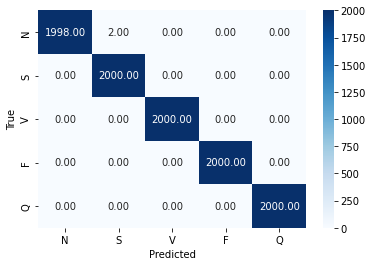


              precision    recall  f1-score   support

           N       1.00      1.00      1.00      2000
           S       1.00      1.00      1.00      2000
           V       1.00      1.00      1.00      2000
           F       1.00      1.00      1.00      2000
           Q       1.00      1.00      1.00      2000

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [ ]:
# Test on synthetic

synthetic_dataset_test= make_labelled_dataset(10000, gen_list)
test_dl = preprocess_data(synthetic_dataset_test, 1024, train=False, real_data=False)

accuracy_synthetic = calculate_accuracy(model, test_dl)

print()
plot_cm(model, test_dl, class_names)

del synthetic_dataset_test

In [ ]:
print(f"Cross-classification metric = {accuracy_real/accuracy_synthetic:.3f}")

Cross-classification metric = 0.503


## Identifiability

### Likelihood ratio

In [ ]:
file_loc="all_records_train.csv"
real_data = load_ecg_data(file_loc, np=False, drop_class=False, drop_patient=False)
real_data.drop('Class', axis=1, inplace=True)

# EUCLIDEAN DISTANCE
# inter-patient distance
inter_patient_distances = np.array([])
patient_nb = real_data['Patient'].unique()
for patient in patient_nb:
  condition= real_data['Patient']==patient
  df_patient = real_data[condition].copy().reset_index(drop=True)
  other_patients = real_data[~condition].copy().reset_index(drop=True)
  d= euclidean_distances(df_patient.iloc[:, :-1].values, other_patients.iloc[:, :-1].values).ravel()
  inter_patient_distances =np.append(inter_patient_distances, d.ravel())
  del d
# inter_patient_distances.tofile(f'inter_patient_distances_euclidean.csv', sep = ',')

# intra-patient distance
intra_patient_distances = np.array([])
patient_nb = real_data['Patient'].unique()
for patient in patient_nb:
  condition= real_data['Patient']==patient
  df_patient = real_data[condition].copy().reset_index(drop=True)
  d= euclidean_distances(df_patient.iloc[:, :-1].values, df_patient.iloc[:, :-1].values)
  ds = []
  for row in range(d.shape[0]):
    for col in range(d.shape[1]):
      if col>row:
        ds.append(d[row, col])
  intra_patient_distances =np.append(intra_patient_distances, np.array(ds))
  del d
# intra_patient_distances.tofile(f'intra_patient_distances_euclidean.csv', sep = ',')

n_bins = 20
plt.figure(figsize = (12, 8))
plt.hist(intra_patient_distances, n_bins, density = True, histtype ='bar', label='intra-patient', alpha=.5)
plt.hist(inter_patient_distances, n_bins, density = True, histtype ='bar', label='inter-patient', alpha=.5)
plt.title('Distance between signals', fontsize =20)
plt.legend()
plt.xlabel("Euclidean distance", fontsize=16)
plt.ylabel("Density", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize =16)
plt.savefig('euclidean_distance_20_bins.png')

counts_inter, bins_inter = np.histogram(inter_patient_distances, bins=100, density=True)
counts_intra, bins_intra = np.histogram(intra_patient_distances, bins=np.concatenate((np.array([0]), bins_inter), axis=0), density=True)

n_bins = 100
plt.figure(figsize = (12, 8))
plt.hist(intra_patient_distances, bins=bins_inter, density = True, histtype ='bar', label='intra-patient', alpha=.5)
plt.hist(inter_patient_distances, bins= np.concatenate((np.array([0]), bins_inter), axis=0), density = True, histtype ='bar', label='inter-patient', alpha=.5)
plt.title('Distance between signals', fontsize =20)
plt.legend()
plt.xlabel("Euclidean distance", fontsize=16)
plt.ylabel("Density", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize =16)
plt.savefig('euclidean_distance_100_bins.png')

df = pd.DataFrame(bins_intra[:-1], columns=['Distance'])
df['inter-patient']=np.concatenate((np.array([0]), counts_inter), axis=0)
df['intra-patient']=counts_intra
df['pdf_intra-patient']=counts_intra/ sum(counts_intra)
df['pdf_inter-patient']=np.concatenate((np.array([0]), counts_inter), axis=0)/ sum(np.concatenate((np.array([0]), counts_inter), axis=0))
df['cum_inter']= df['pdf_inter-patient'].cumsum()
df['cum_intra']= df['pdf_intra-patient'].cumsum()
df['ratio']= df['pdf_intra-patient']/ df['pdf_inter-patient']
df.to_csv("likelihood_ratio.csv")

In [ ]:
likelihood_df = pd.read_csv("likelihood_ratio.csv", index_col=0)
likelihood_df

,Distance,inter-patient,intra-patient,pdf_intra-patient,pdf_inter-patient,cum_inter,cum_intra,ratio
0,0.000000,0.000000e+00,2.898965e-05,3.118826e-06,0.000000e+00,0.000000,0.000003,inf
1,0.011564,5.583371e-05,1.358542e-02,1.461575e-03,6.006838e-06,0.000006,0.001465,243.318588
2,0.119148,4.133891e-04,3.261120e-02,3.508448e-03,4.447423e-05,0.000050,0.004973,78.887220
3,0.226733,1.048867e-03,4.058218e-02,4.365999e-03,1.128418e-04,0.000163,0.009339,38.691340
4,0.334317,1.523994e-03,5.528822e-02,5.948135e-03,1.639581e-04,0.000327,0.015287,36.278394
...,...,...,...,...,...,...,...,...
96,10.232085,9.501232e-07,2.832715e-06,3.047552e-07,1.022185e-07,0.999997,0.999999,2.981410
97,10.339670,1.347926e-06,3.540894e-06,3.809440e-07,1.450158e-07,0.999997,1.000000,2.626913
98,10.447254,5.049790e-06,2.124536e-06,2.285664e-07,5.432788e-07,0.999998,1.000000,0.420717
99,10.554838,1.352200e-05,7.081787e-07,7.618879e-08,1.454756e-06,0.999999,1.000000,0.052372


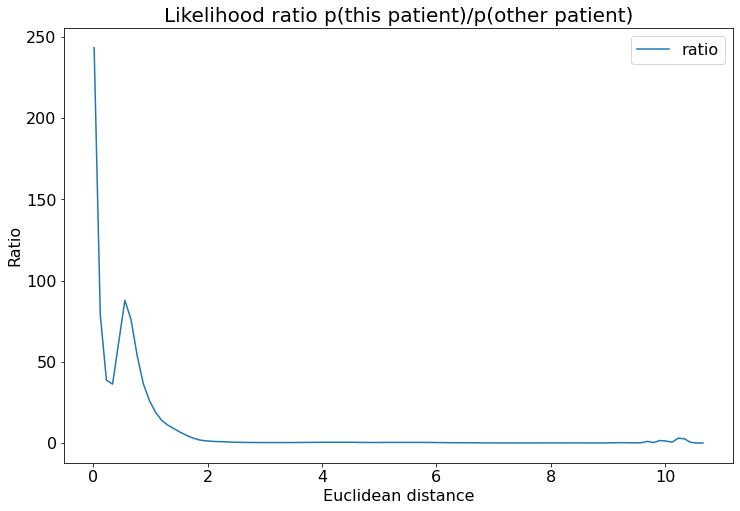

In [ ]:
plt.figure(figsize = (12, 8))
plt.plot(likelihood_df['Distance'].values, likelihood_df['ratio'].values, label='ratio')
plt.title(f'Likelihood ratio p(this patient)/p(other patient)', fontsize =20)
plt.xlabel(f"Euclidean distance", fontsize=16)
plt.ylabel("Ratio", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize =16);
plt.show()

In [ ]:
file_loc="/content/drive/MyDrive/Colab Notebooks/all_records_train.csv"
real_data = load_ecg_data(file_loc, np=False, drop_class=False, drop_patient=False)
real_data.drop('Class', axis=1, inplace=True)
patient_nb = real_data['Patient'].unique()
real_data.shape

(76065, 164)

In [ ]:
#  1k synthetic samples will be generated, and the minimum Euclidean
# distance between each synthetic sample and the training samples will be calculated
data_synthetic = generate_samples(10000)
print(data_synthetic.shape)
data_synthetic

(10000, 163)


array([[5.8891690e-01, 6.6934633e-01, 6.6088229e-01, ..., 1.5916348e-04,
        2.3233524e-04, 1.5883418e-04],
       [5.8585250e-01, 6.6803110e-01, 8.0066085e-01, ..., 1.5844211e-04,
        3.0812295e-04, 1.5819001e-04],
       [5.8918470e-01, 6.6835076e-01, 6.5927488e-01, ..., 2.1582449e-04,
        1.6549267e-04, 2.1304753e-04],
       ...,
       [5.8625412e-01, 6.6742504e-01, 7.9357582e-01, ..., 1.5892401e-04,
        2.8498840e-04, 1.5863501e-04],
       [5.8911455e-01, 6.6786617e-01, 8.0313879e-01, ..., 1.5863108e-04,
        2.9086243e-04, 1.5824492e-04],
       [5.8615279e-01, 8.8633823e-01, 7.9708731e-01, ..., 1.5589895e-04,
        2.3585207e-04, 1.5578615e-04]], dtype=float32)

In [ ]:
ratios = []
likely_patients = []
model = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(real_data.iloc[:,:-1].values)
distances, indices = model.kneighbors(data_synthetic)
distances = distances.flatten()
indices = indices.flatten()
for i, d in enumerate(distances):
  ratios.append(likelihood_df[likelihood_df['Distance']>d].head(1)['ratio'].values[0])
  likely_patients.append(real_data.iloc[indices[i], -1])

In [ ]:
# Create the pandas DataFrame with column name is provided explicitly
df_ratio = pd.DataFrame(ratios, columns=['ratio'])
df_ratio['likely patient']=likely_patients
df_ratio['distance']=distances
df_ratio['Count']=1

In [ ]:
df_ratio

,ratio,likely patient,distance,Count
0,53.762186,210,0.747518,1
1,76.004037,213,0.646399,1
2,26.050496,106,0.914131,1
3,76.004037,201,0.619271,1
4,26.050496,121,0.886659,1
...,...,...,...,...
9995,26.050496,221,0.954568,1
9996,76.004037,234,0.588030,1
9997,76.004037,234,0.587787,1
9998,76.004037,234,0.644217,1


In [ ]:
fig = px.histogram(df_ratio, x="ratio", y="Count", barmode="relative")
# fig.update_xaxes(type='category')
fig.update_layout(yaxis_title='Number of synthetic signals', height=500, width=700, title=f'Distribution of likelihood ratios',
                      xaxis_title='Likelihood ratio')
fig.update_xaxes(range=[0, 90])
fig.show()

In [ ]:
df_ratio.dtypes

ratio             float64
likely patient      int64
distance          float64
Count               int64
dtype: object

In [ ]:
fig = px.scatter(df_ratio, x="distance", y="ratio", color="distance",
                 title="How likelihood ratio relates to distance from real sample")
fig.update_layout(height=500, width=800)
fig.show()

In [ ]:
fig = px.histogram(df_ratio, x="ratio", y="Count", color="likely patient", barmode="relative")

fig.update_layout(yaxis_title='Number of synthetic signals', height=500, width=800, title=f'Distribution of likelihood ratios',
                      xaxis_title='Likelihood ratio')
fig.show()

In [ ]:
fig = px.treemap(df_ratio, path=['ratio', 'likely patient'], values='Count')
fig.show()

In [ ]:
fig = px.histogram(df_ratio, x="likely patient", y="Count", color="likely patient", barmode="relative")
fig.update_xaxes(type='category')
fig.update_layout(yaxis_title='Number of signals', height=500, width=800)
fig.show()

## Membership Inference Attack

### Using Euclidean Distance

In [ ]:
file_directory = "/content/drive/MyDrive/Colab Notebooks/"
real_data_train = load_ecg_data(file_directory+"all_records_train.csv", np=False, drop_class=True).sample(500).reset_index(drop=True)
real_data_train["training_data"]=1
real_data_test = load_ecg_data(file_directory+"all_records_test.csv", np=False, drop_class=True).sample(500).reset_index(drop=True)
real_data_test["training_data"]=0
data_df = pd.concat([real_data_train, real_data_test]).reset_index(drop=True)
data_df

,0,1,2,3,4,5,6,7,8,9,...,154,155,156,157,158,159,160,161,162,training_data
0,0.144231,0.266589,0.269548,0.286281,0.300827,0.294834,0.293261,0.291495,0.299189,0.297654,...,-4.827477e-04,1.625703e-03,-2.074241e-03,1.871264e-03,-1.232989e-03,4.408338e-04,2.531724e-04,-6.889141e-04,8.144354e-04,1
1,0.661634,0.783678,0.798199,0.959892,0.713500,0.205102,0.045722,0.033556,0.033917,0.048026,...,-3.922029e-09,2.213925e-09,-4.169146e-10,-9.924072e-10,1.762713e-09,-1.870247e-09,1.463794e-09,-7.819295e-10,7.150303e-11,1
2,0.671082,0.809729,0.842082,0.895073,0.945943,0.903230,0.682538,0.360666,0.185769,0.212081,...,1.111418e-02,-5.512457e-03,-6.305723e-04,1.957308e-03,-4.363267e-03,3.933789e-03,-2.929753e-03,1.784154e-03,-5.038974e-04,1
3,0.660542,0.839223,0.930043,0.798600,0.368347,0.098816,0.106194,0.115920,0.123567,0.119110,...,9.175952e-08,-6.432042e-07,8.809540e-07,-8.302015e-07,5.818072e-07,-2.520755e-07,-5.288752e-08,2.605011e-07,-3.402384e-07,1
4,0.753931,0.764327,0.518381,0.553016,0.574509,0.542351,0.544443,0.490649,0.426473,0.309930,...,-7.446497e-06,-1.224624e-05,2.344027e-05,-2.562123e-05,2.067583e-05,-1.177863e-05,2.260227e-06,5.252461e-06,-9.281165e-06,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.734892,0.943426,0.859062,0.815889,0.770930,0.713508,0.667421,0.575618,0.497965,0.396116,...,-6.989691e-05,6.743111e-05,-4.863976e-05,2.268053e-05,1.946388e-06,-1.934132e-05,2.697201e-05,-2.539356e-05,1.728887e-05,0
996,0.652255,0.786492,0.877737,0.875105,0.747923,0.573162,0.488397,0.470247,0.442842,0.423932,...,2.486378e-07,-1.079554e-07,-2.129323e-08,1.096635e-07,-1.458775e-07,1.347701e-07,-9.177639e-08,3.630266e-08,1.401339e-08,0
997,0.676295,0.975302,0.699424,0.225365,0.062294,0.098357,0.081686,0.036394,0.031992,0.045406,...,-2.489295e-07,1.310804e-07,-1.256057e-08,-7.660478e-08,1.218199e-07,-1.234240e-07,9.260896e-08,-4.576408e-08,-8.638638e-10,0
998,0.562799,0.858914,1.005937,0.527643,0.090470,0.137559,0.148567,0.122660,0.129678,0.115982,...,1.323497e-05,-1.417386e-05,1.128094e-05,-6.323647e-06,1.113249e-06,2.958231e-06,-5.150836e-06,5.383754e-06,-4.078536e-06,0


In [ ]:
# Create 10k synthetic examples

sequence_lengths_list= [max_sequence_length]*10000
fake_noise = random_generator(10000, z_dim, sequence_lengths_list, max_sequence_length, device=device)
fake = gen(fake_noise)
fake_sup = sup(fake)
reconstructed_fake = enc_dec.decode(fake_sup).detach().cpu()
synthetic_data = reconstructed_fake.squeeze().numpy()
synthetic_data.shape

(10000, 163)

In [ ]:
def get_rates(df_classification):
  condition1=df_classification['classification']==1
  condition2=df_classification['correct']==True
  condition3=df_classification['member']==1
  # tp/p
  tpr = len(df_classification[condition1 & condition2]) / len(df_classification[condition3])

  # fp/n
  fpr = len(df_classification[condition1 & (~condition3)]) / len(df_classification[~condition3])

  return tpr, fpr

In [ ]:

tprs = []
fprs = []
accuracies = []
model = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(synthetic_data)
distances, indices = model.kneighbors(data_df.iloc[:,:-1].values)
distances = distances.flatten()
indices = indices.flatten()
thresholds = np.linspace(distances.min(), distances.max(), 20)
for threshold_member in thresholds:

  member = distances< threshold_member
  bool_to_int = lambda t: 1 if t else 0
  member = np.array(list(map(bool_to_int , member)))

  # initialize data of lists.
  classification = {'index': list(range(len(data_df))),
          'classification': member,
          'member': data_df.iloc[:,-1].values}

  # Create DataFrame
  df_classification = pd.DataFrame(classification)
  df_classification['correct'] = df_classification['classification']==df_classification['member']

  accuracy = sum(df_classification['correct'])/ len(df_classification) * 100
  accuracies.append(accuracy)
  tpr, fpr = get_rates(df_classification)
  tprs.append(tpr)
  fprs.append(fpr)

In [ ]:
# Evaluating model performance at various thresholds
df = pd.DataFrame({
    'False Positive Rate': fprs,
    'True Positive Rate': tprs,
    'Threshold': thresholds
}, index=thresholds)
df.set_index('Threshold', inplace=True)

fig_thresh = px.line(
    df, title='TPR and FPR at every threshold',
    width=700, height=500
)

fig_thresh.show()

In [ ]:
from sklearn.metrics import auc

In [ ]:
fig = px.area(
    x=fprs, y=tprs,
    title=f'ROC Curve (AUC={auc(fprs, tprs):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=500, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

In [ ]:
fig = px.area(
    x=fprs, y=tprs,
    title=f'ROC Curve (AUC={auc(fprs, tprs):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=500, height=500
)

x = np.linspace(0,1)
fig.add_trace(go.Scatter(x=x, y=x,line=dict(dash='dash', color="black")))


# fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(type="log", range=[-5,0], constrain='domain')

fig.update_layout(showlegend=False)
fig.show()

In [ ]:
df['Accuracy'] = accuracies
df

,False Positive Rate,True Positive Rate,Accuracy
Threshold,,,
0.573211,0.000,0.000,50.0
0.774005,0.046,0.036,49.5
0.974798,0.178,0.144,48.3
1.175592,0.362,0.338,48.8
1.376386,0.552,0.508,47.8
1.577179,0.684,0.634,47.5
1.777973,0.768,0.740,48.6
1.978767,0.828,0.822,49.7
2.179560,0.920,0.908,49.4


Accuracy of classifier:  49.9



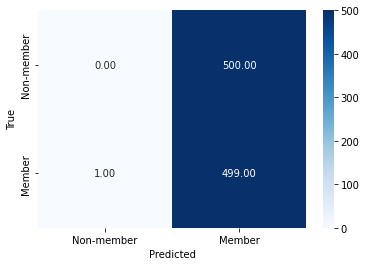


              precision    recall  f1-score   support

  Non-member       0.00      0.00      0.00       500
      Member       0.50      1.00      0.67       500

    accuracy                           0.50      1000
   macro avg       0.25      0.50      0.33      1000
weighted avg       0.25      0.50      0.33      1000



In [ ]:
accuracy = sum(df_classification['correct'])/ len(df_classification) * 100
print("Accuracy of classifier: ", accuracy)
print()
#confusion matrix function
#make a dictionary to map the target indices to class names
categories = {0: 'Non-member', 1: 'Member'}
cm = confusion_matrix(df_classification['member'].values, df_classification['classification'].values)
sns.heatmap(cm, annot=True, fmt= '.2f', cmap='Blues', xticklabels=categories.values(), yticklabels=categories.values())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()
print()
print(classification_report(df_classification['member'].values, df_classification['classification'].values, target_names=categories.values()))

### Using Cosine Similarity

In [ ]:
tprs = []
fprs = []
accuracies = []
model = NearestNeighbors(n_neighbors=1, algorithm='brute', metric="cosine").fit(synthetic_data)
_, indices = model.kneighbors(data_df.iloc[:,:-1].values)
indices = indices.flatten()
similarities = np.diagonal(cosine_similarity(data_df.iloc[:,:-1].values, synthetic_data[indices]))

thresholds = np.linspace(similarities.min(), similarities.max(), 20)

for threshold_member in thresholds:

  member = similarities > threshold_member
  bool_to_int = lambda t: 1 if t else 0
  member = np.array(list(map(bool_to_int , member)))

  # initialize data of lists.
  classification = {'index': list(range(len(data_df))),
          'classification': member,
          'member': data_df.iloc[:,-1].values}

  # Create DataFrame
  df_classification = pd.DataFrame(classification)
  df_classification['correct'] = df_classification['classification']==df_classification['member']

  accuracy = sum(df_classification['correct'])/ len(df_classification) * 100
  accuracies.append(accuracy)
  tpr, fpr = get_rates(df_classification)
  tprs.append(tpr)
  fprs.append(fpr)


In [ ]:
# Evaluating model performance at various thresholds
df = pd.DataFrame({
    'False Positive Rate': fprs,
    'True Positive Rate': tprs,
    'Threshold': thresholds
}, index=thresholds)
df.set_index('Threshold', inplace=True)

fig_thresh = px.line(
    df, title='TPR and FPR at every threshold',
    width=700, height=500
)

fig_thresh.show()

In [ ]:
fig = px.area(
    x=fprs, y=tprs,
    title=f'ROC Curve (AUC={auc(fprs, tprs):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

In [ ]:
df['Accuracy'] = accuracies
df

,False Positive Rate,True Positive Rate,Accuracy
Threshold,,,
0.498590,0.998,1.000,50.1
0.524313,0.990,0.966,48.8
0.550036,0.982,0.956,48.7
0.575760,0.978,0.954,48.8
0.601483,0.978,0.952,48.7
0.627206,0.968,0.950,49.1
0.652930,0.968,0.946,48.9
0.678653,0.968,0.944,48.8
0.704376,0.962,0.944,49.1


Accuracy of classifier:  50.0



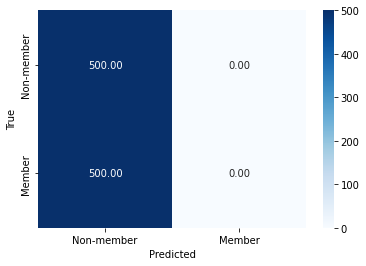


              precision    recall  f1-score   support

  Non-member       0.50      1.00      0.67       500
      Member       0.00      0.00      0.00       500

    accuracy                           0.50      1000
   macro avg       0.25      0.50      0.33      1000
weighted avg       0.25      0.50      0.33      1000



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
accuracy = sum(df_classification['correct'])/ len(df_classification) * 100
print("Accuracy of classifier: ", accuracy)
print()
#confusion matrix function
#make a dictionary to map the target indices to class names
categories = {0: 'Non-member', 1: 'Member'}
cm = confusion_matrix(df_classification['member'].values, df_classification['classification'].values)
sns.heatmap(cm, annot=True, fmt= '.2f', cmap='Blues', xticklabels=categories.values(), yticklabels=categories.values())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()
print()
print(classification_report(df_classification['member'].values, df_classification['classification'].values, target_names=categories.values()))